In [5]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
import math
import os
from glob import glob
from scipy.stats import norm
from sklearn.preprocessing import PowerTransformer,StandardScaler
import seaborn as sns
import datetime
from datetime import datetime
from datetime import timedelta
%matplotlib inline

# **Reading data into jupyter**

In [6]:
df = pd.read_csv("C:/Users/prett/Desktop/System/csv files/zimbabwe_private_banking_dummy.csv",encoding='cp1252')
df

,Client_ID,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Account_Balance.1,Loan_Status,Investment_Products,Credit_Score,Fraud_Flag,Random_Code,Temp_Notes,Unnecessary_Column
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,49231.0,Rejected,Real Estate,351.0,1,NaN,NaN,6896
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,19704.0,Approved,Mutual Funds,624.0,0,X1,To be updated,8843
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,17023.0,Pending,Stocks,576.0,0,Z3,NaN,8063
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,47691.0,Approved,Stocks,835.0,0,NaN,To be updated,9495
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,8647.0,Rejected,Bonds,785.0,0,Z3,Check later,2348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1996,44,Female,Student,345,2070,14,Investments,Masvingo,ZWL,NaN,Approved,NaN,681.0,0,Z3,NaN,3631
996,1997,29,Female,Business Owner,5831,58310,14,Savings,Kwekwe,USD,3406.0,Pending,Bonds,691.0,0,Z3,To be updated,7391
997,1998,23,Male,Civil Servant,355,1420,16,Savings,Harare,USD,33765.0,Pending,Real Estate,351.0,0,Z3,To be updated,9287
998,1999,51,Female,Salaried,2542,2542,7,Loans,Bulawayo,ZWL,9377.0,Approved,Bonds,588.0,0,NaN,NaN,3369


In [7]:
df.columns

Index(['Client_ID', 'Age', 'Gender', 'Occupation', 'Monthly_Income',
       'Account_Balance', 'Transaction_Frequency', 'Preferred_Product',
       'Branch_Location', 'Currency_Used', 'Account_Balance.1', 'Loan_Status',
       'Investment_Products', 'Credit_Score', 'Fraud_Flag', 'Random_Code',
       'Temp_Notes', 'Unnecessary_Column'],
      dtype='object')

In [8]:
df.drop(columns=['   '],inplace = True, errors='ignore')

In [9]:
df.drop(columns=['Unnecessary_Column','Random_Code'],inplace = True)

In [10]:
df.columns

Index(['Client_ID', 'Age', 'Gender', 'Occupation', 'Monthly_Income',
       'Account_Balance', 'Transaction_Frequency', 'Preferred_Product',
       'Branch_Location', 'Currency_Used', 'Account_Balance.1', 'Loan_Status',
       'Investment_Products', 'Credit_Score', 'Fraud_Flag', 'Temp_Notes'],
      dtype='object')

In [11]:
df.head()

,Client_ID,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Account_Balance.1,Loan_Status,Investment_Products,Credit_Score,Fraud_Flag,Temp_Notes
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,49231.0,Rejected,Real Estate,351.0,1,NaN
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,19704.0,Approved,Mutual Funds,624.0,0,To be updated
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,17023.0,Pending,Stocks,576.0,0,NaN
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,47691.0,Approved,Stocks,835.0,0,To be updated
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,8647.0,Rejected,Bonds,785.0,0,Check later


In [12]:
print(df.shape)

(1000, 16)


# **EDA**

In [13]:
df.columns

Index(['Client_ID', 'Age', 'Gender', 'Occupation', 'Monthly_Income',
       'Account_Balance', 'Transaction_Frequency', 'Preferred_Product',
       'Branch_Location', 'Currency_Used', 'Account_Balance.1', 'Loan_Status',
       'Investment_Products', 'Credit_Score', 'Fraud_Flag', 'Temp_Notes'],
      dtype='object')

In [14]:
df['Currency_Used'].value_counts()

Currency_Used
USD    697
ZiG    218
ZWL     85
Name: count, dtype: int64

In [15]:
df['Branch_Location'].value_counts()

Branch_Location
Bulawayo    181
Gweru       175
Kwekwe      171
Harare      163
Mutare      157
Masvingo    153
Name: count, dtype: int64

In [16]:
cols = ["Client_ID", "Age", "Gender", "Occupation", "Monthly_Income", "Account_Balance", "Transaction_Frequency", "Preferred_Product", "Branch_Location",
        "Currency_Used", "Loan_Status", "Investment_Products", "Credit_Score"]

In [17]:
df = df[cols]
df.head()

,Client_ID,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,Approved,Stocks,835.0
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,Rejected,Bonds,785.0


In [18]:
df.shape

(1000, 13)

# **Getting CIFs**

In [19]:
df = df.rename(columns={'Client_ID': 'CIFs'})
df['CIFs'] = df['CIFs'].astype(str)

In [20]:
df.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,Approved,Stocks,835.0
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,Rejected,Bonds,785.0


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CIFs                   1000 non-null   object 
 1   Age                    1000 non-null   int64  
 2   Gender                 1000 non-null   object 
 3   Occupation             1000 non-null   object 
 4   Monthly_Income         1000 non-null   int64  
 5   Account_Balance        1000 non-null   int64  
 6   Transaction_Frequency  1000 non-null   int64  
 7   Preferred_Product      1000 non-null   object 
 8   Branch_Location        1000 non-null   object 
 9   Currency_Used          1000 non-null   object 
 10  Loan_Status            1000 non-null   object 
 11  Investment_Products    800 non-null    object 
 12  Credit_Score           950 non-null    float64
dtypes: float64(1), int64(4), object(8)
memory usage: 101.7+ KB


In [22]:
df.isnull().sum()

CIFs                       0
Age                        0
Gender                     0
Occupation                 0
Monthly_Income             0
Account_Balance            0
Transaction_Frequency      0
Preferred_Product          0
Branch_Location            0
Currency_Used              0
Loan_Status                0
Investment_Products      200
Credit_Score              50
dtype: int64

In [23]:
df.shape

(1000, 13)

In [24]:
df_clean = df.dropna(subset=['Investment_Products'])

In [25]:
df_clean.isnull().sum()

CIFs                      0
Age                       0
Gender                    0
Occupation                0
Monthly_Income            0
Account_Balance           0
Transaction_Frequency     0
Preferred_Product         0
Branch_Location           0
Currency_Used             0
Loan_Status               0
Investment_Products       0
Credit_Score             39
dtype: int64

In [26]:
df_clean.shape

(800, 13)

# **Customer age analysis**

In [27]:
df_clean["Age"].min()

21

In [28]:
df_clean["Age"].max()

69

In [29]:
df_clean["Age"].value_counts()

Age
46    30
48    24
67    23
57    22
55    22
53    22
43    21
69    21
42    20
25    20
21    20
28    19
68    19
65    19
52    19
45    19
37    18
56    17
41    17
23    17
44    17
64    17
32    17
59    16
39    16
22    16
54    16
33    15
24    15
36    15
31    14
49    14
62    14
29    14
34    14
51    13
60    13
61    13
50    13
26    13
47    13
40    11
38    11
63    11
27    11
66    11
35    10
58    10
30     8
Name: count, dtype: int64

## Customers below 27 years

In [30]:
Customers_below_27 = df_clean[df_clean["Age"]<27]
Customers_below_27.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score
15,1016,23,Female,Retired,874,6118,57,Savings,Harare,USD,Pending,Stocks,595.0
17,1018,22,Male,Student,160,320,28,Loans,Mutare,USD,Pending,Stocks,623.0
22,1023,22,Male,Salaried,1339,13390,59,Savings,Bulawayo,ZiG,Pending,Real Estate,654.0
44,1045,24,Female,Salaried,4496,44960,36,Investments,Harare,USD,Pending,Bonds,339.0
49,1050,22,Female,Business Owner,5218,41744,1,Savings,Gweru,USD,Rejected,Bonds,816.0


In [31]:
Customers_below_27["Age"].value_counts()

Age
21    20
25    20
23    17
22    16
24    15
26    13
Name: count, dtype: int64

In [32]:
Customers_below_27['Currency_Used'].nunique()

3

In [33]:
Customers_below_27["Investment_Products"].value_counts()

Investment_Products
Bonds           30
Real Estate     28
Stocks          22
Mutual Funds    21
Name: count, dtype: int64

In [34]:
Customers_below_27["Occupation"].value_counts()

Occupation
Salaried          29
Business Owner    26
Retired           19
Civil Servant     18
Student            9
Name: count, dtype: int64

# **Frequency-Monetary (FM) Analysis**

In [35]:
print("Columns in df_clean:")
print(df_clean.columns.tolist())

Columns in df_clean:
['CIFs', 'Age', 'Gender', 'Occupation', 'Monthly_Income', 'Account_Balance', 'Transaction_Frequency', 'Preferred_Product', 'Branch_Location', 'Currency_Used', 'Loan_Status', 'Investment_Products', 'Credit_Score']


In [36]:
frequency = df_clean.groupby(by='CIFs', as_index=False)['Transaction_Frequency'].max()
frequency.columns = ['CIFs', 'Frequency']

In [37]:
monetary = df_clean.groupby(by='CIFs', as_index=False)['Account_Balance'].mean()
monetary.columns = ['CIFs', 'Monetary']

In [38]:
FM = frequency.merge(monetary, on='CIFs')

FM.head()

,CIFs,Frequency,Monetary
0,1001,30,13872.0
1,1002,50,3408.0
2,1003,9,21480.0
3,1004,35,62860.0
4,1005,8,5713.0


In [39]:
FM.describe()

,Frequency,Monetary
count,800.000000,800.000000
mean,31.155000,15876.945000
std,16.938185,17784.401119
min,1.000000,137.000000
25%,17.000000,3486.000000
50%,31.000000,8802.000000
75%,45.250000,21982.500000
max,59.000000,89254.000000


In [40]:
FM = FM[FM['Monetary'] > 0]  

In [41]:
print(f"Removed zero-balance customers. Remaining: {len(FM)}")

Removed zero-balance customers. Remaining: 800


In [42]:
FM.describe()

,Frequency,Monetary
count,800.000000,800.000000
mean,31.155000,15876.945000
std,16.938185,17784.401119
min,1.000000,137.000000
25%,17.000000,3486.000000
50%,31.000000,8802.000000
75%,45.250000,21982.500000
max,59.000000,89254.000000


# **Exploratory Data Analysis of FM Features**

In [43]:
customers_rank = FM.copy()

# Create a new column that is the rank of the Monetary value in descending order
customers_rank['Rank'] = customers_rank['Monetary'].rank(ascending=0).astype(int)
customers_rank = customers_rank.sort_values('Rank')
customers_rank.head()

,CIFs,Frequency,Monetary,Rank
192,1244,56,89254.0,1
129,1162,28,86832.0,2
593,1743,32,85734.0,3
526,1664,22,84010.0,4
710,1898,59,80080.0,5


In [44]:
FM = frequency.merge(monetary, on='CIFs')
FM = FM[(FM['Monetary'] > 0) & (FM['Frequency'] > 0)]
FM.set_index('CIFs', inplace=True)

print("FM Analysis Complete!")
print(f"Analyzing {len(FM)} active clients")
print("\nTop 5 clients by account balance:")
print(FM.sort_values('Monetary', ascending=False).head())

FM Analysis Complete!
Analyzing 800 active clients

Top 5 clients by account balance:
      Frequency  Monetary
CIFs                     
1244         56   89254.0
1162         28   86832.0
1743         32   85734.0
1664         22   84010.0
1898         59   80080.0


In [45]:
customers_rank.sort_values('Rank', ascending=True).head()

,CIFs,Frequency,Monetary,Rank
192,1244,56,89254.0,1
129,1162,28,86832.0,2
593,1743,32,85734.0,3
526,1664,22,84010.0,4
710,1898,59,80080.0,5


In [46]:
customers_rank.shape

(800, 4)

In [47]:
top_20_cutoff = customers_rank.shape[0] * 20 / 100
top_20_cutoff

160.0

**Pareto Rule**

In [48]:
pareto_cutoff = FM['Monetary'].sum() * 0.8
print("The 80% of total account balance is: ", round(pareto_cutoff, 2))

The 80% of total account balance is:  10161244.8


### **Top 20% Customers' Revenue**

In [49]:
balanceByTop20 = customers_rank[customers_rank['Rank'] <= top_20_cutoff]['Monetary'].sum()
balanceByTop20

np.float64(7382371.0)

In [50]:
total_balance = 10161244.8 / 0.8  
balance_by_top_20 = 7382371.0
percentage_contribution = (balance_by_top_20 / total_balance) * 100

print(f"Top 20% Individual Customers are contributing {percentage_contribution:.2f}% of total Account Balance")
print(f"Therefore, in this case the Pareto Rule does not hold")
print(f"Actually, most of the Account Balance is concentrated in just 20% of customers")

Top 20% Individual Customers are contributing 58.12% of total Account Balance
Therefore, in this case the Pareto Rule does not hold
Actually, most of the Account Balance is concentrated in just 20% of customers


In [51]:
balanceByTop20 / customers_rank['Monetary'].sum()

np.float64(0.581217844490864)

# **Applying K Means**

In [52]:
FM.head()

,Frequency,Monetary
CIFs,,
1001,30,13872.0
1002,50,3408.0
1003,9,21480.0
1004,35,62860.0
1005,8,5713.0


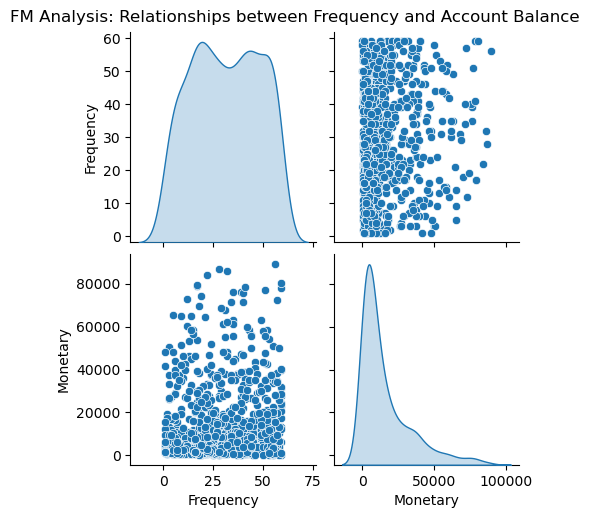

In [53]:
from matplotlib import pyplot as plt
import seaborn as sns

sns.pairplot(FM, diag_kind='kde')
plt.suptitle('FM Analysis: Relationships between Frequency and Account Balance', y=1.02)
plt.show()

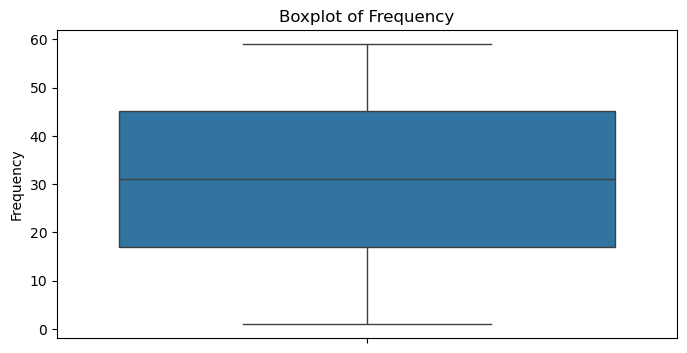

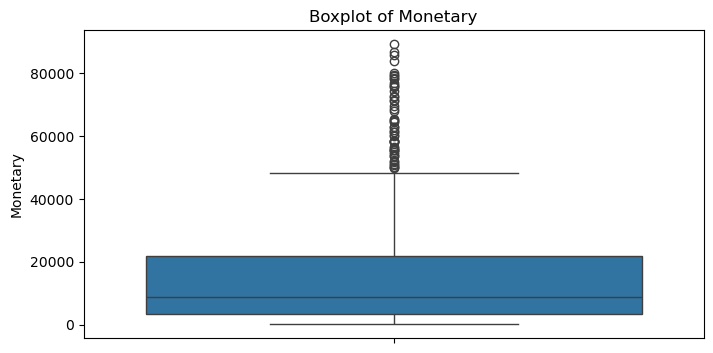

In [54]:
for i in FM.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(y=FM[i])
    plt.title(f'Boxplot of {i}')
    plt.show()

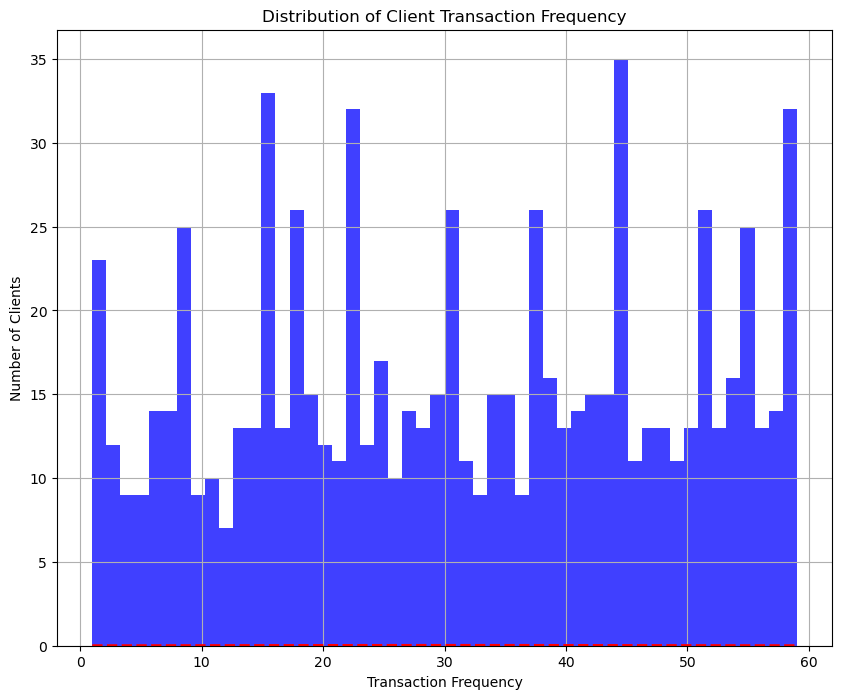

In [55]:
x = FM.Frequency
mu = np.mean(FM.Frequency)
sigma = math.sqrt(np.var(FM.Frequency))

plt.figure(figsize=(10,8))
n, bins, patches = plt.hist(x, 50, facecolor='blue', alpha=0.75)

# Add normal distribution curve
y = norm.pdf(bins, mu, sigma)
l = plt.plot(bins, y, 'r--', linewidth=2)

plt.xlabel('Transaction Frequency')
plt.ylabel('Number of Clients')
plt.title('Distribution of Client Transaction Frequency')
plt.grid(True)
plt.show()

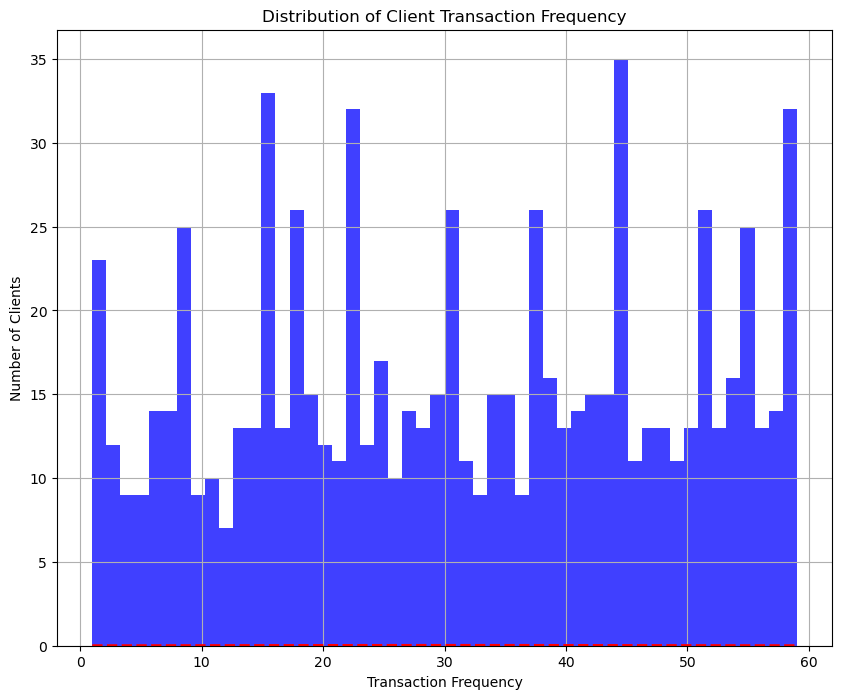

In [56]:
x = FM.Frequency
mu = np.mean(FM.Frequency)
sigma = math.sqrt(np.var(FM.Frequency))

plt.figure(figsize=(10,8))
n, bins, patches = plt.hist(x, 50, facecolor='blue', alpha=0.75)

# Add normal distribution curve
y = norm.pdf(bins, mu, sigma)
l = plt.plot(bins, y, 'r--', linewidth=2)

plt.xlabel('Transaction Frequency')
plt.ylabel('Number of Clients')
plt.title('Distribution of Client Transaction Frequency')
plt.grid(True)
plt.show()

In [57]:
FM[FM['Monetary'] <= 0]

,Frequency,Monetary
CIFs,,


In [58]:
FM['frequency_log'] = FM['Frequency'].apply(math.log)
FM['amount_log'] = FM['Monetary'].apply(math.log)

In [59]:
feature_vector = ['amount_log', 'frequency_log']  # Only these two since you don't have Recency
X_subset = FM[feature_vector].values

In [60]:
# Prepare your features
feature_vector = ['amount_log', 'frequency_log']
X_subset = FM[feature_vector].values

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_subset)

print("Data is now ready for clustering!")
print(f"Original shape: {X_subset.shape}")
print(f"Scaled shape: {X_scaled.shape}")

Data is now ready for clustering!
Original shape: (800, 2)
Scaled shape: (800, 2)


In [61]:
X_scaled

array([[ 0.41990637,  0.24761201],
       [-0.67065355,  0.84235957],
       [ 0.75960236, -1.1541577 ],
       ...,
       [-1.35079837, -0.48426879],
       [-0.89841848, -1.44675979],
       [-0.3786316 ,  0.32275336]])

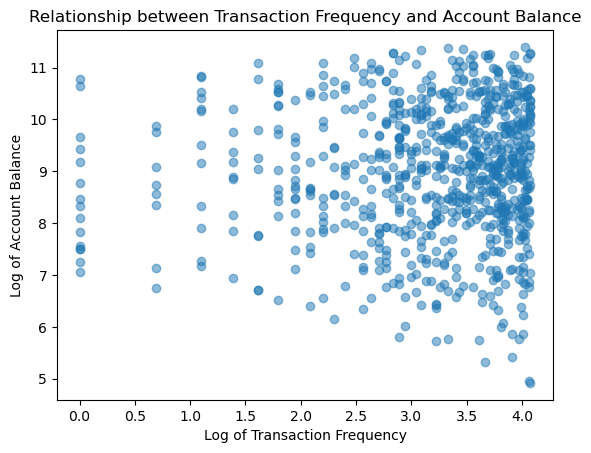

In [62]:
plt.scatter(FM.frequency_log, FM.amount_log, alpha=0.5)
plt.xlabel('Log of Transaction Frequency')
plt.ylabel('Log of Account Balance')
plt.title('Relationship between Transaction Frequency and Account Balance')
plt.show()

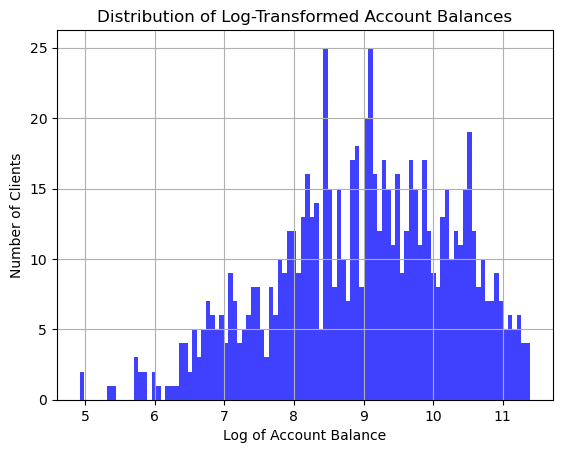

In [63]:
x = FM.amount_log
n, bins, patches = plt.hist(x, 100, facecolor='blue', alpha=0.75)

plt.xlabel('Log of Account Balance')
plt.ylabel('Number of Clients')
plt.title('Distribution of Log-Transformed Account Balances')
plt.grid(True)
plt.show()

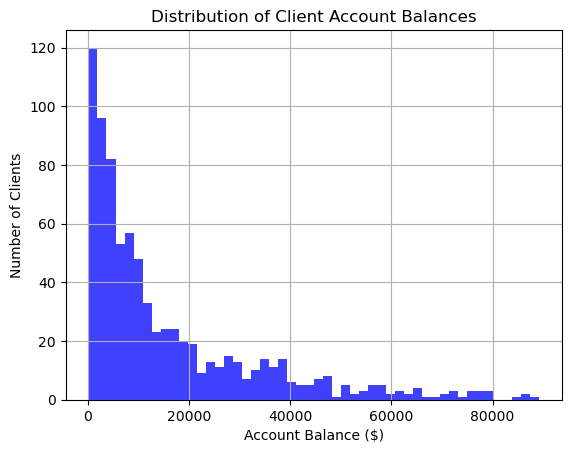

In [64]:
x = FM.Monetary  # Raw account balances
n, bins, patches = plt.hist(x, 50, facecolor='blue', alpha=0.75)

plt.xlabel('Account Balance ($)')  
plt.ylabel('Number of Clients')
plt.title('Distribution of Client Account Balances')  
plt.grid(True)
plt.show()

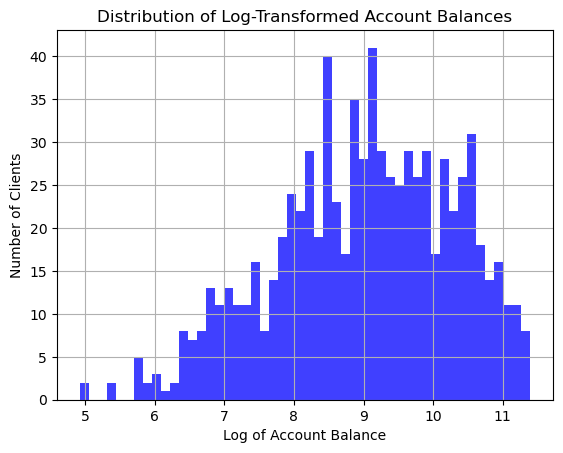

In [65]:
x = FM.amount_log  # Log-transformed balances 
n, bins, patches = plt.hist(x, 50, facecolor='blue', alpha=0.75)

plt.xlabel('Log of Account Balance') 
plt.ylabel('Number of Clients')
plt.title('Distribution of Log-Transformed Account Balances')  
plt.grid(True)
plt.show()

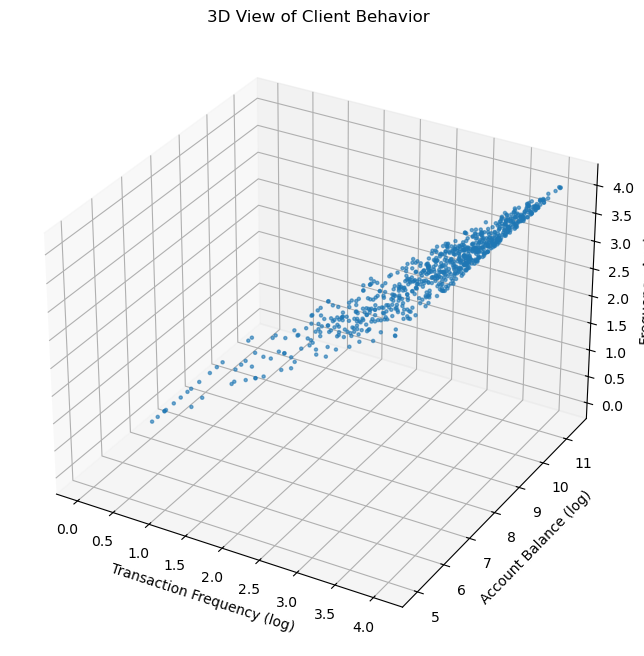

In [66]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


xs = FM.frequency_log  
ys = FM.amount_log       
zs = FM.frequency_log  

ax.scatter(xs, ys, zs, s=5, alpha=0.6)

ax.set_xlabel('Transaction Frequency (log)')
ax.set_ylabel('Account Balance (log)')
ax.set_zlabel('Frequency Again')  
ax.set_title('3D View of Client Behavior')

plt.show()

# **Applying Customer Segmentation**

In [67]:
FM.head()

,Frequency,Monetary,frequency_log,amount_log
CIFs,,,,
1001,30,13872.0,3.401197,9.537628
1002,50,3408.0,3.912023,8.133881
1003,9,21480.0,2.197225,9.974878
1004,35,62860.0,3.555348,11.048665
1005,8,5713.0,2.079442,8.650500


In [68]:
fm_log = FM[['frequency_log', 'amount_log']]
fm_log.head()

,frequency_log,amount_log
CIFs,,
1001,3.401197,9.537628
1002,3.912023,8.133881
1003,2.197225,9.974878
1004,3.555348,11.048665
1005,2.079442,8.650500


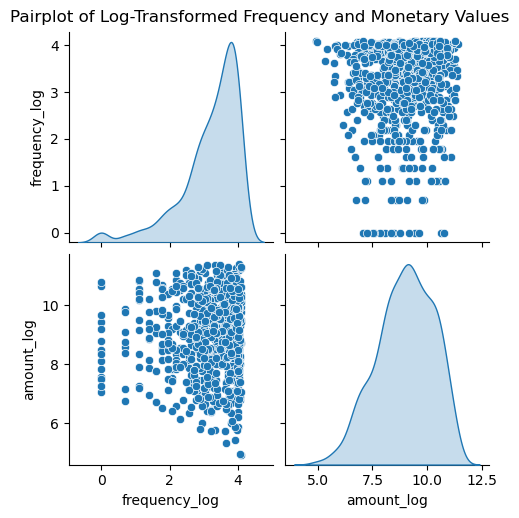

In [69]:
sns.pairplot(fm_log, diag_kind='kde')
plt.suptitle('Pairplot of Log-Transformed Frequency and Monetary Values', y=1.02)
plt.show()

In [70]:
fm_df = FM[['Frequency', 'Monetary']]
fm_df.head()

,Frequency,Monetary
CIFs,,
1001,30,13872.0
1002,50,3408.0
1003,9,21480.0
1004,35,62860.0
1005,8,5713.0


In [71]:
scaler = StandardScaler()
X = scaler.fit_transform(fm_df)  # Use your FM DataFrame
rfm_scaled = pd.DataFrame(X, columns=fm_df.columns)
rfm_scaled.head()

,Frequency,Monetary
0,-0.068232,-0.112807
1,1.113271,-0.701556
2,-1.308810,0.315252
3,0.227144,2.643465
4,-1.367885,-0.571867


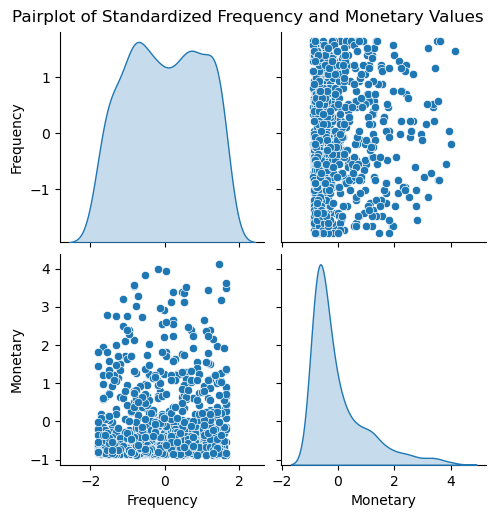

In [72]:
sns.pairplot(rfm_scaled, diag_kind='kde')
plt.suptitle('Pairplot of Standardized Frequency and Monetary Values', y=1.02)
plt.show()

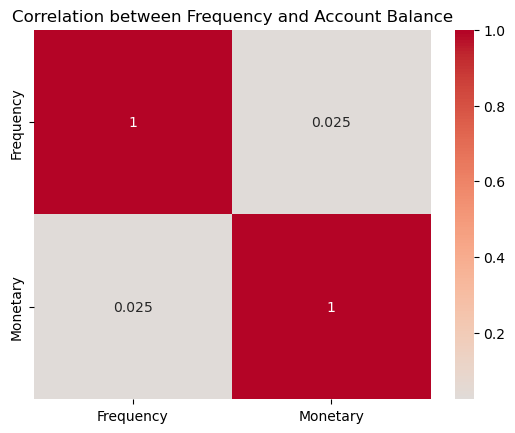

In [73]:
sns.heatmap(fm_df.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation between Frequency and Account Balance')
plt.show()

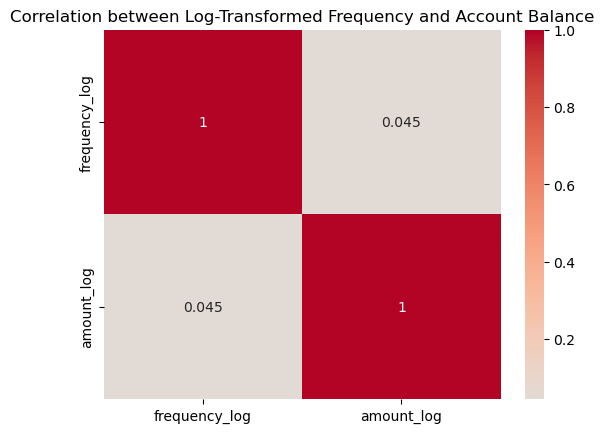

In [74]:
sns.heatmap(fm_log.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation between Log-Transformed Frequency and Account Balance')
plt.show()

# **Using Power Transformer**

In [75]:
fm_data = FM.copy()

In [76]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()
fm_data_transformed = pd.DataFrame(pt.fit_transform(FM[['Frequency', 'Monetary']]))
features = ['Frequency', 'Monetary']
fm_data_transformed.columns = features
fm_data_transformed.head()

,Frequency,Monetary
0,0.002931,0.360133
1,1.081662,-0.726118
2,-1.337584,0.739535
3,0.284585,1.764662
4,-1.412628,-0.348452


In [77]:
fm_data_transformed.describe()

,Frequency,Monetary
count,8.000000e+02,8.000000e+02
mean,-7.549517e-17,4.352074e-16
std,1.000626e+00,1.000626e+00
min,-2.020805e+00,-2.594429e+00
25%,-7.858848e-01,-7.100856e-01
50%,6.004302e-02,-1.307079e-02
75%,8.358681e-01,7.601857e-01
max,1.533607e+00,2.130418e+00


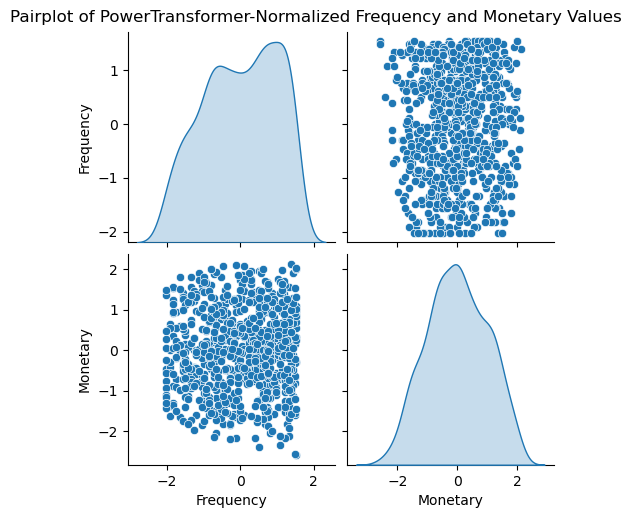

In [78]:
sns.pairplot(fm_data_transformed, diag_kind='kde')
plt.suptitle('Pairplot of PowerTransformer-Normalized Frequency and Monetary Values', y=1.02)
plt.show()

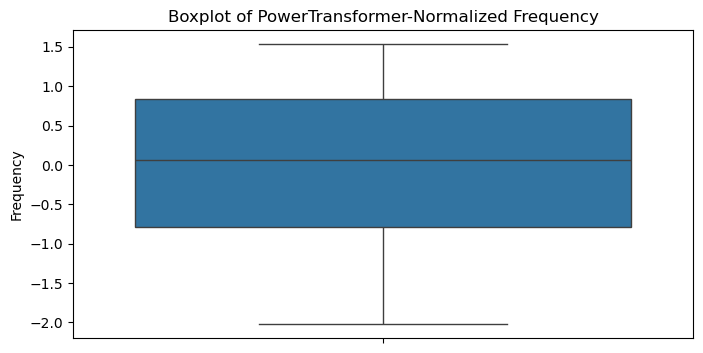

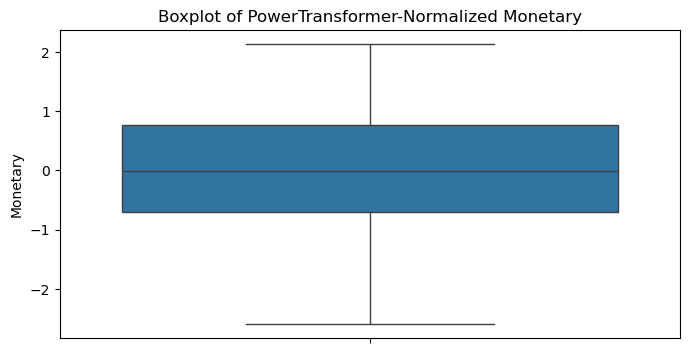

In [79]:
for i in fm_data_transformed.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(y=fm_data_transformed[i])
    plt.title(f'Boxplot of PowerTransformer-Normalized {i}')
    plt.show()

In [80]:
fm_data_transformed.mean().round(2)

Frequency   -0.0
Monetary     0.0
dtype: float64

In [81]:
fm_data_transformed.std().round(2)

Frequency    1.0
Monetary     1.0
dtype: float64

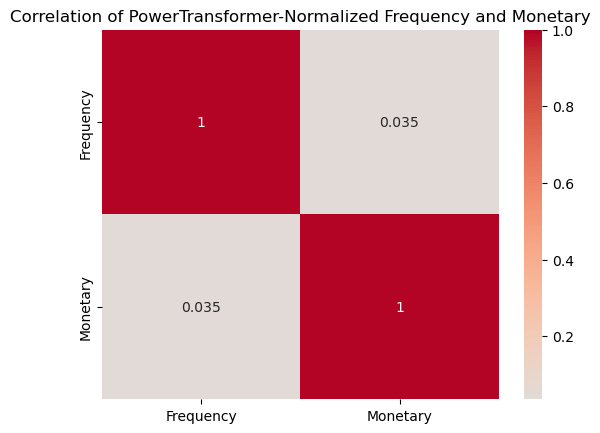

In [82]:
sns.heatmap(fm_data_transformed.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation of PowerTransformer-Normalized Frequency and Monetary')
plt.show()

In [83]:
x = fm_data_transformed.copy()

In [84]:
x.head()

,Frequency,Monetary
0,0.002931,0.360133
1,1.081662,-0.726118
2,-1.337584,0.739535
3,0.284585,1.764662
4,-1.412628,-0.348452


## Choosing K

In [85]:
from sklearn.cluster import KMeans

In [86]:
from sklearn.cluster import KMeans

# First, create the KMeans object
kmeans = KMeans(n_clusters=4, random_state=42)  # You need this line!

# Now apply clustering
y_pred = kmeans.fit_predict(x)

print("Clustering completed successfully!")
print(f"Created {len(np.unique(y_pred))} customer segments")

Clustering completed successfully!
Created 4 customer segments


In [87]:
y_pred = kmeans.fit_predict(x)

In [88]:
y_pred

array([0, 1, 0, 3, 2, 2, 3, 1, 3, 1, 1, 3, 1, 2, 2, 1, 3, 3, 3, 3, 2, 3,
       2, 1, 1, 3, 3, 3, 0, 1, 0, 0, 2, 1, 1, 3, 1, 0, 0, 1, 0, 3, 2, 2,
       2, 1, 0, 1, 1, 0, 3, 1, 2, 1, 1, 0, 1, 1, 0, 3, 0, 3, 1, 1, 0, 3,
       3, 1, 3, 1, 2, 2, 2, 2, 1, 3, 1, 1, 1, 3, 3, 1, 3, 2, 2, 3, 0, 3,
       1, 2, 1, 0, 1, 2, 1, 1, 0, 3, 1, 0, 1, 2, 1, 1, 1, 0, 1, 3, 1, 1,
       0, 1, 2, 0, 2, 1, 3, 3, 3, 0, 1, 3, 1, 2, 0, 3, 2, 0, 2, 0, 0, 0,
       3, 2, 0, 3, 1, 0, 1, 2, 0, 0, 1, 1, 1, 2, 0, 1, 0, 0, 1, 0, 2, 2,
       3, 1, 0, 2, 0, 3, 3, 2, 1, 3, 3, 2, 0, 2, 0, 1, 1, 2, 0, 2, 2, 1,
       1, 1, 3, 3, 0, 1, 1, 2, 0, 2, 1, 0, 0, 3, 1, 3, 3, 2, 3, 1, 0, 1,
       3, 0, 1, 0, 1, 3, 3, 0, 0, 2, 2, 0, 0, 1, 3, 1, 1, 2, 0, 2, 2, 3,
       0, 1, 0, 0, 1, 1, 3, 3, 0, 1, 1, 1, 2, 2, 1, 1, 0, 1, 0, 1, 1, 1,
       3, 2, 3, 0, 1, 2, 0, 2, 1, 3, 1, 0, 0, 3, 1, 1, 0, 3, 1, 3, 2, 1,
       2, 3, 0, 2, 0, 3, 1, 1, 1, 2, 3, 1, 0, 0, 2, 3, 2, 2, 1, 2, 2, 0,
       1, 0, 3, 3, 2, 3, 1, 0, 0, 2, 3, 1, 1, 0, 0,

In [89]:
# NOW you can access cluster centers
cluster_centers = kmeans.cluster_centers_
print("Cluster centers (in normalized space):")
print(cluster_centers)

Cluster centers (in normalized space):
[[-0.80937218  0.81613908]
 [ 0.78561683 -0.64384742]
 [-1.01290408 -0.87543234]
 [ 0.8418297   0.98979793]]


In [90]:
kmeans.transform(x)

array([[0.93154631, 1.27301733, 1.59954455, 1.04891788],
       [2.4401982 , 0.30726427, 2.09988177, 1.7325951 ],
       [0.53373814, 2.5341135 , 1.64728182, 2.19373601],
       ...,
       [2.12917101, 1.76814979, 0.46614366, 2.85786769],
       [1.87374089, 2.29311188, 0.47978258, 3.01998363],
       [1.57174701, 0.69534877, 1.20578235, 1.61544093]])

In [91]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(x) for k in range(1, 10)]

In [92]:
inertias = [model.inertia_ for model in kmeans_per_k]
print("Inertia values for k=1 to 9:")
for k, inertia in enumerate(inertias, 1):
    print(f"k={k}: {inertia:.2f}")

Inertia values for k=1 to 9:
k=1: 1600.00
k=2: 1043.86
k=3: 652.49
k=4: 460.69
k=5: 378.71
k=6: 321.89
k=7: 267.63
k=8: 237.72
k=9: 210.41


In [93]:
results_df = pd.DataFrame({'Value of k': range(1,10), 'WCSS Score': inertias})
print(results_df)

   Value of k   WCSS Score
0           1  1600.000000
1           2  1043.863328
2           3   652.494036
3           4   460.691089
4           5   378.708161
5           6   321.891561
6           7   267.625095
7           8   237.719839
8           9   210.409035


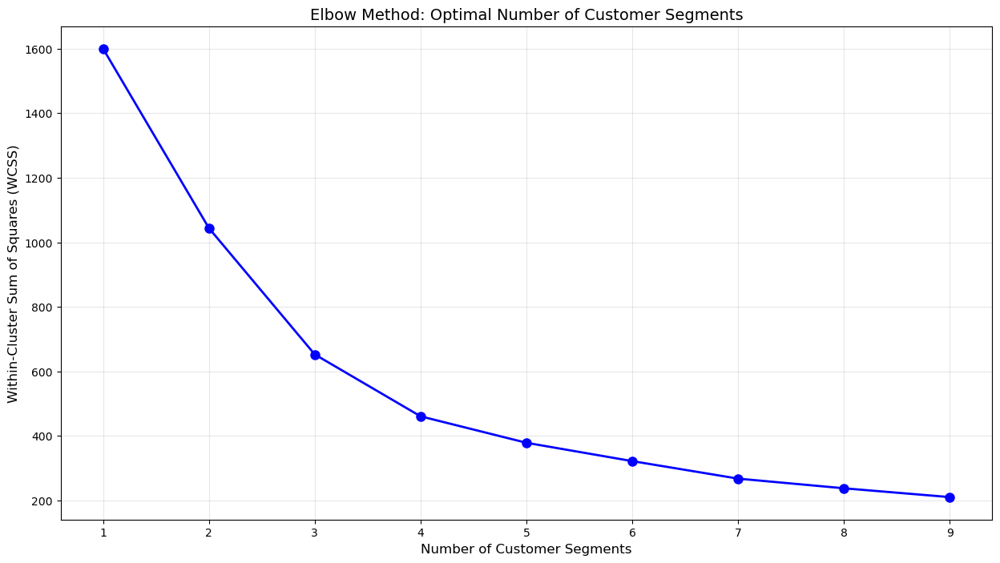

In [94]:
plt.figure(figsize=(15,8))
plt.plot(range(1, 10), inertias, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Number of Customer Segments', fontsize=12)
plt.ylabel('Within-Cluster Sum of Squares (WCSS)', fontsize=12)
plt.title('Elbow Method: Optimal Number of Customer Segments', fontsize=14)
plt.grid(True, alpha=0.3)
plt.show()

In [95]:
# First, check what columns you actually have
print("Columns in FM DataFrame:")
print(FM.columns.tolist())

# If 'Cluster' doesn't exist, create it
if 'Cluster' not in FM.columns:
    kmeans = KMeans(n_clusters=4, random_state=42)
    FM['Cluster'] = kmeans.fit_predict(x)
    print("Created Cluster column")
else:
    print("Cluster column already exists")

Columns in FM DataFrame:
['Frequency', 'Monetary', 'frequency_log', 'amount_log']
Created Cluster column


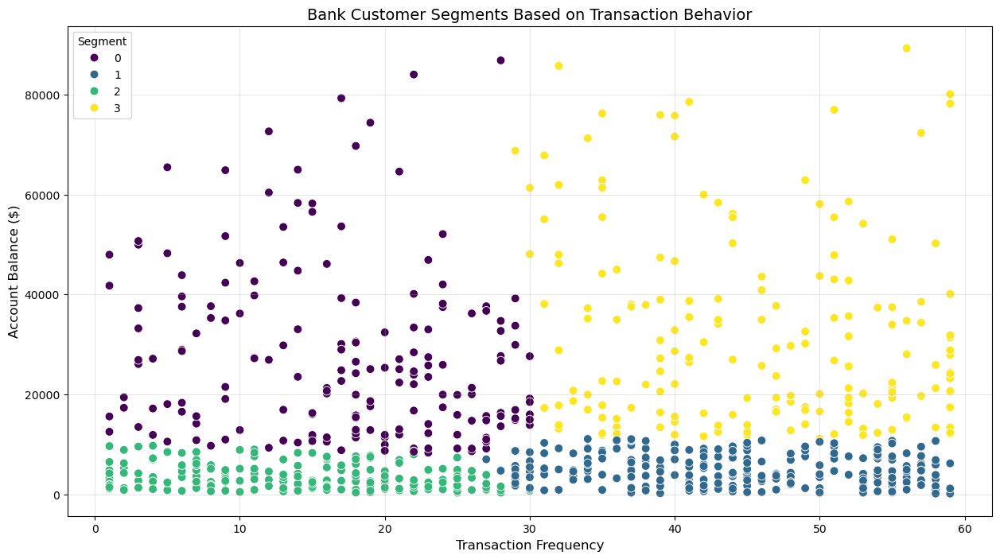

In [96]:
plt.figure(figsize=(15,8))
sns.scatterplot(data=FM, x='Frequency', y='Monetary', hue='Cluster', palette='viridis', s=60)
plt.xlabel('Transaction Frequency', fontsize=12)
plt.ylabel('Account Balance ($)', fontsize=12)
plt.title('Bank Customer Segments Based on Transaction Behavior', fontsize=14)
plt.legend(title='Segment')
plt.grid(True, alpha=0.3)
plt.show()

In [97]:
from sklearn.metrics import silhouette_score

In [98]:
scores = [silhouette_score(x,model.labels_) for model in kmeans_per_k[1:]]

In [99]:
pd.DataFrame({'Value of k':range(2,10),'Silhouette Score':scores})

,Value of k,Silhouette Score
0,2,0.320905
1,3,0.374313
2,4,0.372229
3,5,0.363557
4,6,0.340774
5,7,0.356479
6,8,0.348629
7,9,0.351112


In [100]:
plt.figure(figsize=(15,5))
plt.plot(range(2,10),scores,'bo-')
plt.xlabel('Number of Clusters')

Text(0.5, 0, 'Number of Clusters')

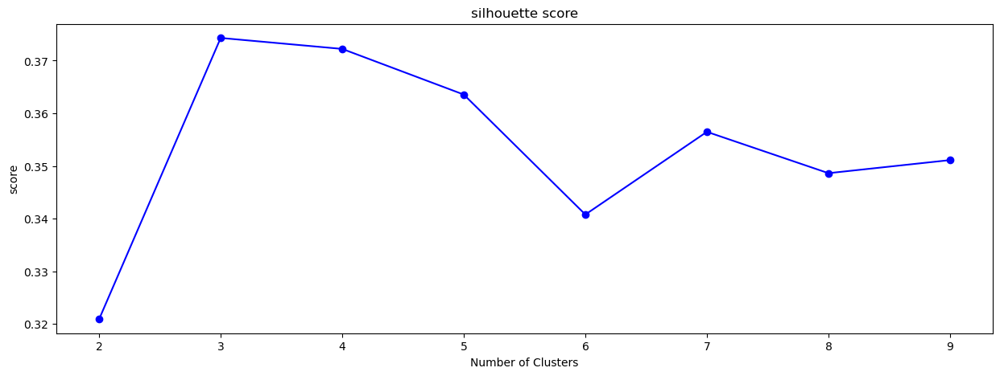

In [101]:
plt.ylabel('score')
plt.title('silhouette score')
plt.show()

In [102]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

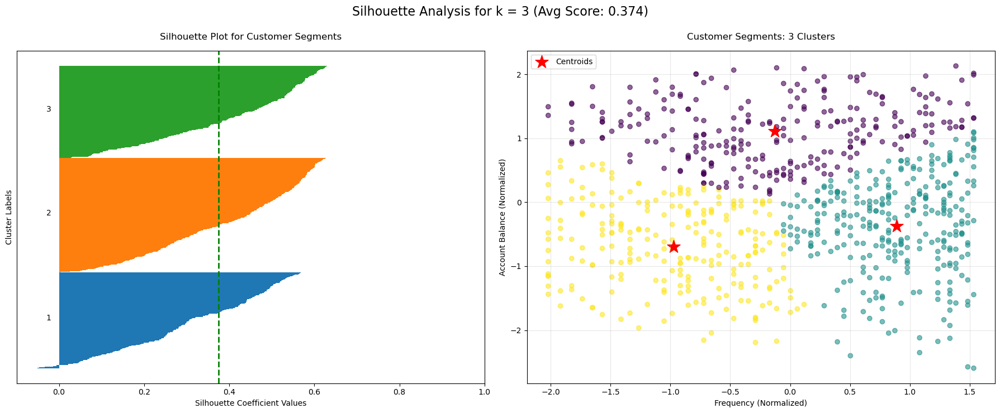

k=3: Average Silhouette Score = 0.374



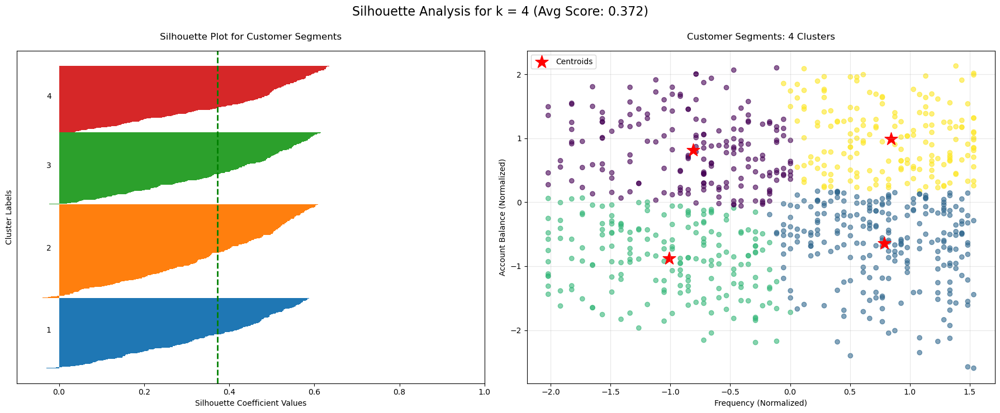

k=4: Average Silhouette Score = 0.372



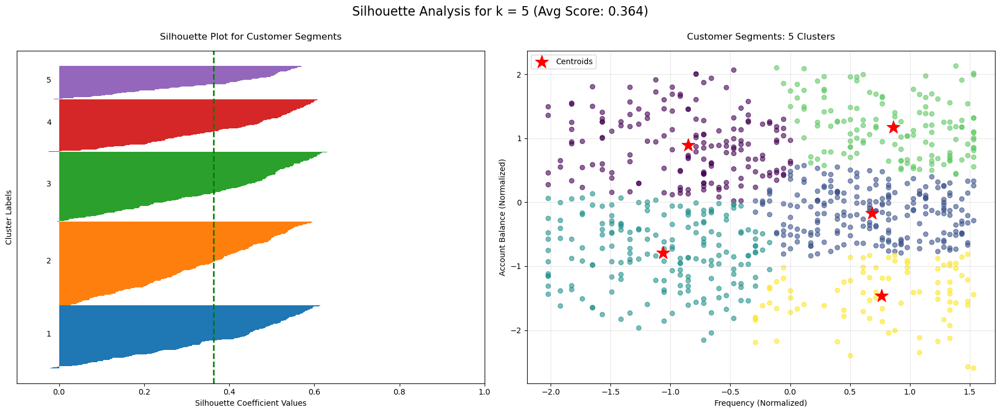

k=5: Average Silhouette Score = 0.364



In [103]:
from sklearn.metrics import silhouette_samples
import numpy as np

X_std = fm_data_transformed.copy()

for i, k in enumerate([3, 4, 5]):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X_std)
    centroids = km.cluster_centers_
    silhouette_vals = silhouette_samples(X_std, labels)

    y_lower, y_upper = 0, 0
    for cluster in np.unique(labels):
        cluster_silhouette_vals = silhouette_vals[labels == cluster]
        cluster_silhouette_vals.sort()
        y_upper += len(cluster_silhouette_vals)
        ax1.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
        ax1.text(-0.03, (y_lower + y_upper) / 2, str(cluster + 1))
        y_lower += len(cluster_silhouette_vals)  # ✅ CORRECT SPELLING

    avg_score = np.mean(silhouette_vals)
    ax1.axvline(avg_score, linestyle='--', linewidth=2, color='green')
    ax1.set_yticks([])
    ax1.set_xlim([-0.1, 1])
    ax1.set_xlabel('Silhouette Coefficient Values')
    ax1.set_ylabel('Cluster Labels')
    ax1.set_title('Silhouette Plot for Customer Segments', y=1.02)
    
    ax2.scatter(X_std.iloc[:, 0], X_std.iloc[:, 1], c=labels, cmap='viridis', alpha=0.6)
    ax2.scatter(centroids[:, 0], centroids[:, 1], marker='*', c='red', s=300, label='Centroids')
    ax2.set_xlabel('Frequency (Normalized)')
    ax2.set_ylabel('Account Balance (Normalized)')
    ax2.set_title(f'Customer Segments: {k} Clusters', y=1.02)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle(f'Silhouette Analysis for k = {k} (Avg Score: {avg_score:.3f})', fontsize=16, y=1.05)
    plt.show()
    print(f"k={k}: Average Silhouette Score = {avg_score:.3f}\n")

## Silhouette score without PCA

In [104]:
final_kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = final_kmeans.fit_predict(fm_data_transformed)
score = silhouette_score(fm_data_transformed, cluster_labels)
print(f"Silhouette Score: {score:.3f}")

Silhouette Score: 0.372


## Inertia without PCA

In [105]:
final_kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = final_kmeans.fit_predict(fm_data_transformed)

# Get the inertia value
inertia = final_kmeans.inertia_
print(f"Inertia (Without PCA): {inertia:.2f}")

Inertia (Without PCA): 460.69


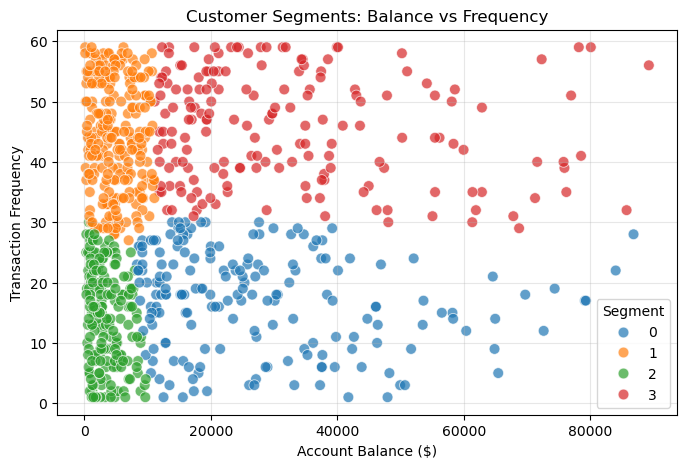

In [106]:
plt.figure(figsize=(8,5))
sns.scatterplot(x=FM['Monetary'], y=FM['Frequency'], 
                hue=FM['Cluster'], palette='tab10', s=60, alpha=0.7)
plt.xlabel('Account Balance ($)')
plt.ylabel('Transaction Frequency')
plt.title('Customer Segments: Balance vs Frequency')
plt.legend(title='Segment')
plt.grid(True, alpha=0.3)
plt.show()

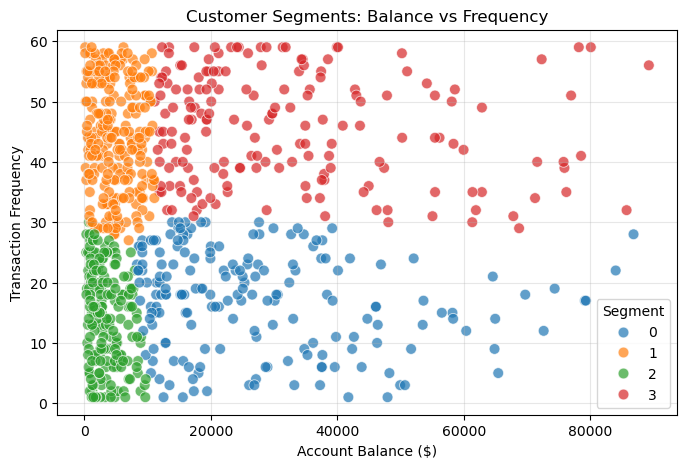

In [107]:
plt.figure(figsize=(8,5))
sns.scatterplot(x=FM['Monetary'], y=FM['Frequency'], 
                hue=FM['Cluster'], palette='tab10', s=60, alpha=0.7)
plt.xlabel('Account Balance ($)')
plt.ylabel('Transaction Frequency')
plt.title('Customer Segments: Balance vs Frequency')
plt.legend(title='Segment')
plt.grid(True, alpha=0.3)
plt.show()

In [108]:
from sklearn.decomposition import PCA

# Prepare your data
pca_data = fm_data_transformed.copy()  # Use your FM data

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(pca_data)

# Create DataFrame with principal components
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])  # Since you have 2 features

print("PCA completed!")
print(f"Original shape: {pca_data.shape}")
print(f"PCA shape: {X_pca.shape}")

PCA completed!
Original shape: (800, 2)
PCA shape: (800, 2)


<Figure size 800x500 with 0 Axes>

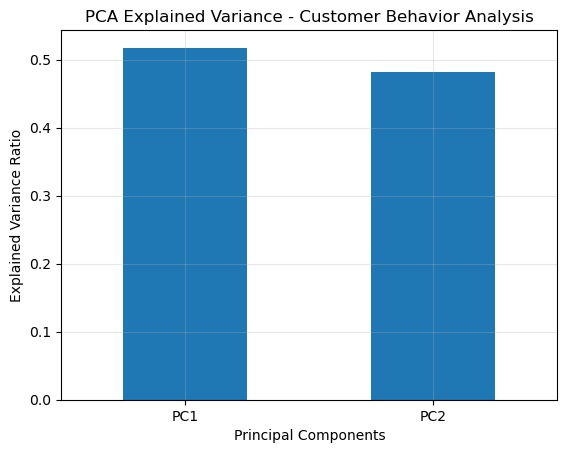

PCA Results for FM Data:
PC1: 0.5176 (51.76% of variance)
PC2: 0.4824 (48.24% of variance)


In [109]:
# Use your FM normalized data
pca_data = fm_data_transformed.copy()

# Apply PCA - keeping all components (2 in your case)
pca_mod = PCA(n_components=pca_data.shape[1], random_state=0)
pcadata = pca_mod.fit_transform(pca_data)

# Get explained variance
exp_var = pca_mod.explained_variance_ratio_.round(4)

# Create visualization
plt.figure(figsize=(8, 5))
pd.DataFrame(exp_var).plot(kind='bar', legend=None)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Explained Variance - Customer Behavior Analysis')
plt.xticks(ticks=[0, 1], labels=['PC1', 'PC2'], rotation=0)
plt.grid(True, alpha=0.3)
plt.show()

# Print numerical results
print("PCA Results for FM Data:")
for i, var in enumerate(exp_var):
    print(f"PC{i+1}: {var:.4f} ({var*100:.2f}% of variance)")

## Silhouette score with PCA

In [110]:
from sklearn.metrics import silhouette_score

# Apply K-Means clustering on PCA-transformed data
pca_kmeans = KMeans(n_clusters=4, random_state=42)  # Use consistent random_state
pca_clusters = pca_kmeans.fit_predict(pcadata)  # Use fit_predict instead of fit

# Calculate silhouette score on PCA data
pca_silhouette = silhouette_score(pcadata, pca_clusters)
print(f"Silhouette Score WITH PCA: {pca_silhouette:.3f}")

Silhouette Score WITH PCA: 0.372


## WCSSE with PCA

In [111]:
# Calculate WCSS (Within-Cluster Sum of Squares) with PCA
pca_kmeans = KMeans(n_clusters=4, random_state=42)
pca_clusters = pca_kmeans.fit_predict(pcadata)

# Get the inertia (WCSS) value
pca_inertia = pca_kmeans.inertia_
print(f"WCSS WITH PCA: {pca_inertia:.2f}")

WCSS WITH PCA: 460.69


In [112]:
pcadata_df = pd.DataFrame(pcadata, columns=['PC1', 'PC2'])
pcadata_df.head(5)

,PC1,PC2
0,0.256725,0.252580
1,0.251408,-1.278293
2,-0.422885,1.468745
3,1.449036,1.046572
4,-1.245272,0.752486


## **Using classification algorithm**

In [113]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import GridSearchCV,cross_val_score,train_test_split
from sklearn.ensemble import RandomForestClassifier

In [114]:
pcadata_df['CLUSTERS'] = pca_kmeans.labels_
pcadata_df.head()

,PC1,PC2,CLUSTERS
0,0.256725,0.252580,0
1,0.251408,-1.278293,1
2,-0.422885,1.468745,0
3,1.449036,1.046572,3
4,-1.245272,0.752486,2


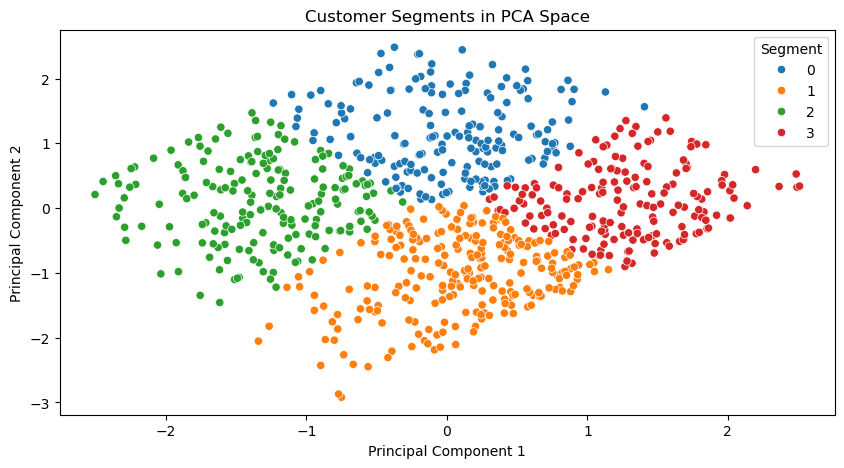

In [115]:
plt.figure(figsize=(10,5))
sns.scatterplot(x=pcadata_df['PC1'], y=pcadata_df['PC2'], 
                hue=pcadata_df['CLUSTERS'], palette='tab10')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Customer Segments in PCA Space')
plt.legend(title='Segment')
plt.show()

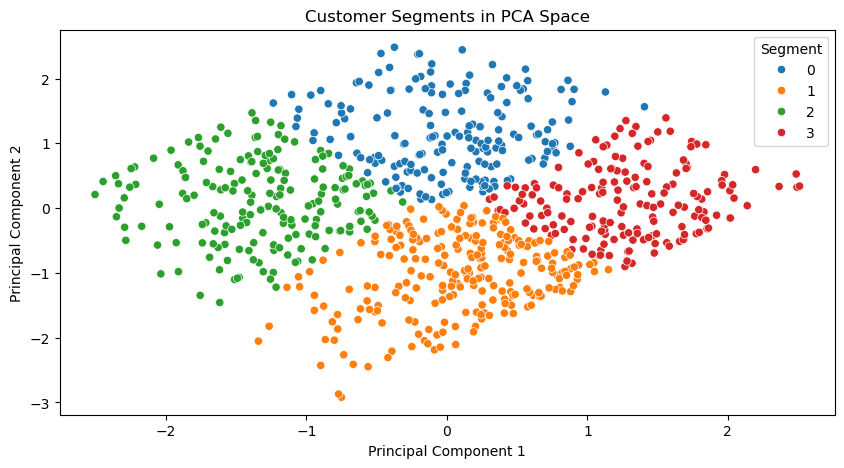

In [116]:
plt.figure(figsize=(10,5))
sns.scatterplot(x=pcadata_df['PC1'], y=pcadata_df['PC2'], 
                hue=pcadata_df['CLUSTERS'], palette='tab10')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Customer Segments in PCA Space')
plt.legend(title='Segment')
plt.show()

In [117]:
FM.head()

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2


In [118]:
fm_segment = FM.copy()
inp = fm_segment.drop(['Cluster'], axis=1)    
out = fm_segment['Cluster']                   

In [119]:
FM.Cluster.value_counts()

Cluster
1    248
2    190
0    186
3    176
Name: count, dtype: int64

## **Random Forest**

In [120]:
xtrain,xtest,ytrain,ytest=train_test_split(inp,out,test_size=0.3,random_state=42)

In [121]:
rf=RandomForestClassifier(random_state=0)
rf.fit(xtrain,ytrain)
ypred=rf.predict(xtest)

In [122]:
print("Accuarcy of Random Forest model = ",accuracy_score(ytest,ypred))

Accuarcy of Random Forest model =  0.9833333333333333


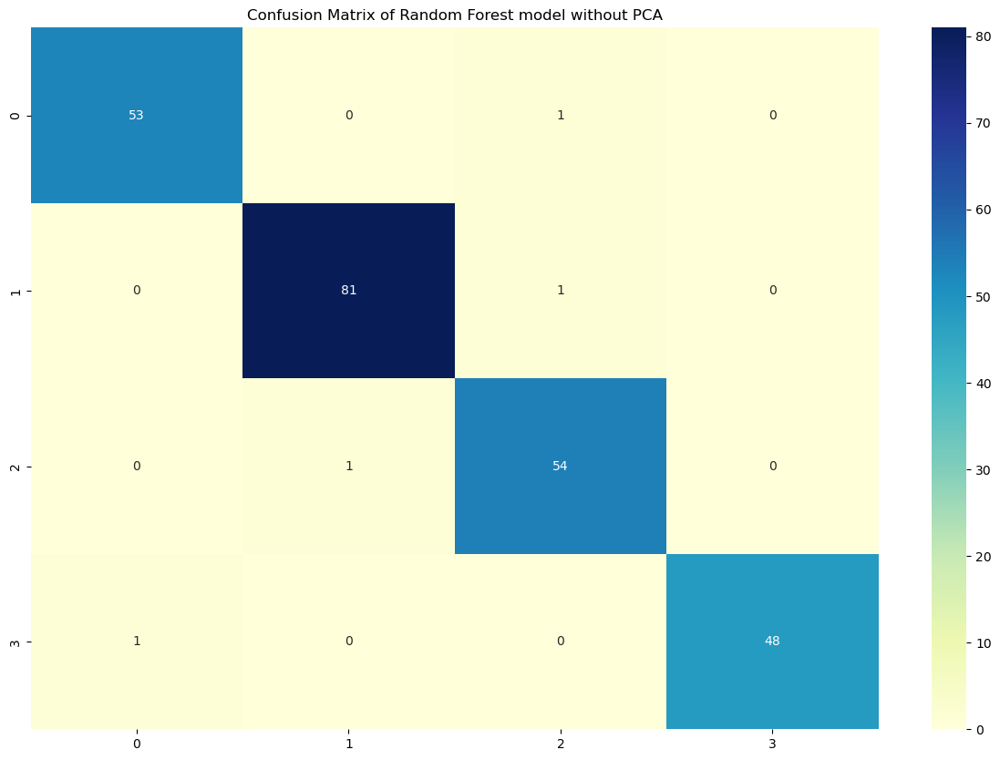

In [123]:
plt.figure(figsize=(15,10))
sns.heatmap(pd.DataFrame(confusion_matrix(ytest,ypred)), annot=True, fmt='d', cmap='YlGnBu');
plt.title('Confusion Matrix of Random Forest model without PCA')
plt.show()

In [124]:
print('Classification Report for Random Forest: \n\n')

print(classification_report(ytest,ypred))

Classification Report for Random Forest: 


              precision    recall  f1-score   support

           0       0.98      0.98      0.98        54
           1       0.99      0.99      0.99        82
           2       0.96      0.98      0.97        55
           3       1.00      0.98      0.99        49

    accuracy                           0.98       240
   macro avg       0.98      0.98      0.98       240
weighted avg       0.98      0.98      0.98       240



## **SCV**

In [125]:
from sklearn.svm import SVC
import sklearn.svm as svm

svc=SVC(random_state=0,kernel='linear')

# svc=svm.LinearSVC(random_state=0)

svc.fit(xtrain,ytrain)


ypred=svc.predict(xtest)

print("Accuracy of SVC model = ",accuracy_score(ytest,ypred))

Accuracy of SVC model =  0.9916666666666667


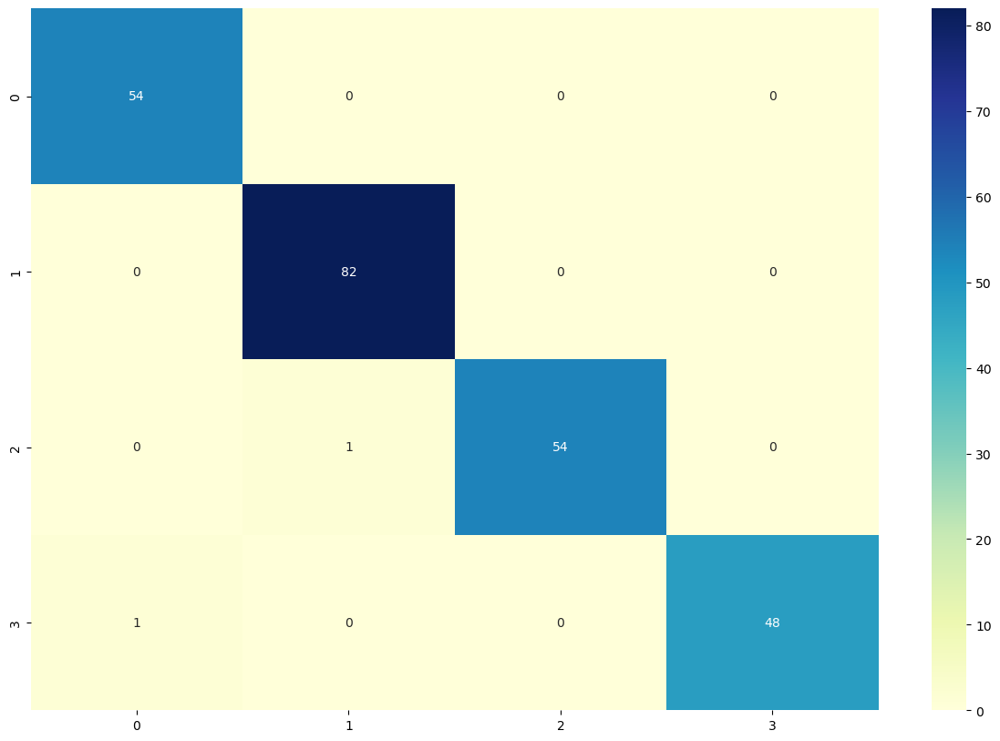

In [126]:
plt.figure(figsize=(15,10))
sns.heatmap(pd.DataFrame(confusion_matrix(ytest,ypred)), annot=True, fmt='d', cmap='YlGnBu');
plt.show()

In [127]:
print('Classification Report for SVC: \n\n')
print(classification_report(ytest,ypred))

Classification Report for SVC: 


              precision    recall  f1-score   support

           0       0.98      1.00      0.99        54
           1       0.99      1.00      0.99        82
           2       1.00      0.98      0.99        55
           3       1.00      0.98      0.99        49

    accuracy                           0.99       240
   macro avg       0.99      0.99      0.99       240
weighted avg       0.99      0.99      0.99       240



# **Reverting RFM values to original form**

In [128]:
fm_inv_transform = FM.copy()
fm_inv_transform.drop('Cluster', axis=1, inplace=True)
fm_inv_transform.set_index(FM.index, inplace=True)
fm_inv_transform.head()

,Frequency,Monetary,frequency_log,amount_log
CIFs,,,,
1001,30,13872.0,3.401197,9.537628
1002,50,3408.0,3.912023,8.133881
1003,9,21480.0,2.197225,9.974878
1004,35,62860.0,3.555348,11.048665
1005,8,5713.0,2.079442,8.650500


In [129]:
# Use the original normalized data that the PowerTransformer was fitted on
fm_inv_transform = pd.DataFrame(pt.inverse_transform(fm_data_transformed), 
                               columns=fm_data_transformed.columns,
                               index=fm_data_transformed.index)
fm_inv_transform.head()

,Frequency,Monetary
0,30.0,13872.0
1,50.0,3408.0
2,9.0,21480.0
3,35.0,62860.0
4,8.0,5713.0


In [130]:
fm_inv_transform['Cluster'] = pca_kmeans.labels_
fm_inv_transform.head()

,Frequency,Monetary,Cluster
0,30.0,13872.0,0
1,50.0,3408.0,1
2,9.0,21480.0,0
3,35.0,62860.0,3
4,8.0,5713.0,2


In [131]:
fm_inv_transform["Frequency"] = fm_inv_transform["Frequency"].astype(int)

In [132]:
fm_inv_transform.head()

,Frequency,Monetary,Cluster
0,30,13872.0,0
1,50,3408.0,1
2,9,21480.0,0
3,35,62860.0,3
4,8,5713.0,2


In [133]:
FM.to_csv("FM_Customer_Segments.csv")

In [134]:
pcadata_df.to_csv("PCA_Customer_Segments.csv")

In [135]:
FM.to_csv("Bank_Customer_Segments_Analysis.csv", index=False)

# **Analysis of the clusters**

In [136]:
FM.groupby('Cluster').mean()

,Frequency,Monetary,frequency_log,amount_log
Cluster,,,,
0,17.134409,27394.623656,2.652282,10.037831
1,44.491935,4940.983871,3.774469,8.197722
2,14.131579,3513.863158,2.382745,7.878701
3,45.556818,32461.125000,3.799463,10.231144


In [137]:
FM.Cluster.value_counts()

Cluster
1    248
2    190
0    186
3    176
Name: count, dtype: int64

In [138]:
FM.Cluster.value_counts().sum()

np.int64(800)

In [139]:
fm_mean = FM.copy()
fm_mean

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2
...,...,...,...,...,...
1995,4,9713.0,1.386294,9.181220,2
1997,14,58310.0,2.639057,10.973529,0
1998,16,1420.0,2.772589,7.258412,2


In [140]:
fm_mean.drop('Cluster', axis=1, inplace=True)

In [141]:
fm_mean.describe()

,Frequency,Monetary,frequency_log,amount_log
count,800.000000,800.000000,800.000000,800.000000
mean,31.155000,15876.945000,3.188525,8.997133
std,16.938185,17784.401119,0.859432,1.287985
min,1.000000,137.000000,0.000000,4.919981
25%,17.000000,3486.000000,2.833213,8.156507
50%,31.000000,8802.000000,3.433987,9.082733
75%,45.250000,21982.500000,3.812157,9.998001
max,59.000000,89254.000000,4.077537,11.399242


In [142]:
fm_segment = FM.copy()
fm_segment.head()

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2


In [143]:
fm_segment['Cluster'].value_counts()

Cluster
1    248
2    190
0    186
3    176
Name: count, dtype: int64

In [144]:
fm_segment.head()

fm_segment['Cluster'].value_counts()

cluster_0 = fm_segment[fm_segment['Cluster']==0]
cluster_1 = fm_segment[fm_segment['Cluster']==1]
cluster_2 = fm_segment[fm_segment['Cluster']==2]
cluster_3 = fm_segment[fm_segment['Cluster']==3]

In [145]:
cluster_0.mean()

Frequency           17.134409
Monetary         27394.623656
frequency_log        2.652282
amount_log          10.037831
Cluster              0.000000
dtype: float64

In [146]:
cluster_0[['Frequency', 'Monetary']].mean()

Frequency       17.134409
Monetary     27394.623656
dtype: float64

In [147]:
cluster_1[['Frequency', 'Monetary']].mean()

Frequency      44.491935
Monetary     4940.983871
dtype: float64

In [148]:
fm_segment.groupby('Cluster')[['Frequency', 'Monetary']].mean()

,Frequency,Monetary
Cluster,,
0,17.134409,27394.623656
1,44.491935,4940.983871
2,14.131579,3513.863158
3,45.556818,32461.125000


In [149]:
FM.groupby('Cluster')[['Frequency', 'Monetary']].median()

,Frequency,Monetary
Cluster,,
0,18.0,22520.0
1,44.5,4562.5
2,15.0,2867.0
3,46.0,27269.0


In [150]:
fm_segment.describe()

,Frequency,Monetary,frequency_log,amount_log,Cluster
count,800.000000,800.000000,800.000000,800.000000,800.000000
mean,31.155000,15876.945000,3.188525,8.997133,1.445000
std,16.938185,17784.401119,0.859432,1.287985,1.073972
min,1.000000,137.000000,0.000000,4.919981,0.000000
25%,17.000000,3486.000000,2.833213,8.156507,1.000000
50%,31.000000,8802.000000,3.433987,9.082733,1.000000
75%,45.250000,21982.500000,3.812157,9.998001,2.000000
max,59.000000,89254.000000,4.077537,11.399242,3.000000


In [151]:
cols = ['Frequency', 'Cluster']
for i in cols:
    fm_segment[i] = fm_segment[i].astype(int)

In [152]:
fm_segment

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2
...,...,...,...,...,...
1995,4,9713.0,1.386294,9.181220,2
1997,14,58310.0,2.639057,10.973529,0
1998,16,1420.0,2.772589,7.258412,2


In [153]:
fm_segment.describe()

,Frequency,Monetary,frequency_log,amount_log,Cluster
count,800.000000,800.000000,800.000000,800.000000,800.000000
mean,31.155000,15876.945000,3.188525,8.997133,1.445000
std,16.938185,17784.401119,0.859432,1.287985,1.073972
min,1.000000,137.000000,0.000000,4.919981,0.000000
25%,17.000000,3486.000000,2.833213,8.156507,1.000000
50%,31.000000,8802.000000,3.433987,9.082733,1.000000
75%,45.250000,21982.500000,3.812157,9.998001,2.000000
max,59.000000,89254.000000,4.077537,11.399242,3.000000


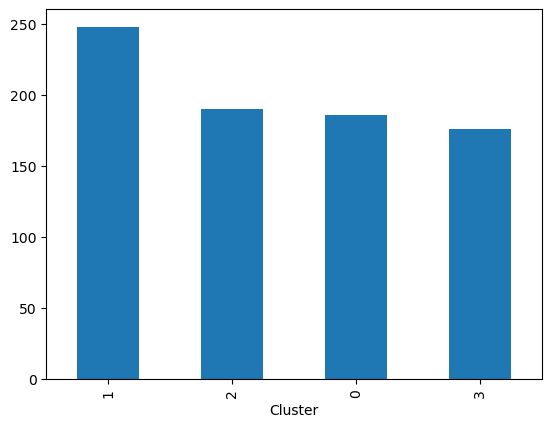

In [154]:
fm_segment['Cluster'].value_counts().plot(kind='bar')
plt.show()

In [155]:
cluster_0.head()

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1003,9,21480.0,2.197225,9.974878,0
1036,4,27136.0,1.386294,10.208617,0
1039,22,33378.0,3.091042,10.415652,0
1040,11,27216.0,2.397895,10.211560,0


## Clusters Descriptions

In [156]:
cluster_0.describe()

,Frequency,Monetary,frequency_log,amount_log,Cluster
count,186.000000,186.000000,186.000000,186.000000,186.0
mean,17.134409,27394.623656,2.652282,10.037831,0.0
std,8.106601,17273.751586,0.734925,0.598649,0.0
min,1.000000,8316.000000,0.000000,9.025937,0.0
25%,11.000000,14088.750000,2.397895,9.553129,0.0
50%,18.000000,22520.000000,2.890372,10.022134,0.0
75%,23.000000,37127.750000,3.135494,10.522098,0.0
max,30.000000,86832.000000,3.401197,11.371730,0.0


In [157]:
cluster_1.describe()

,Frequency,Monetary,frequency_log,amount_log,Cluster
count,248.000000,248.000000,248.000000,248.000000,248.0
mean,44.491935,4940.983871,3.774469,8.197722,1.0
std,8.849617,3110.604344,0.207788,0.927385,0.0
min,27.000000,137.000000,3.295837,4.919981,1.0
25%,37.000000,2335.500000,3.610918,7.755976,1.0
50%,44.500000,4562.500000,3.795426,8.425626,1.0
75%,53.000000,7541.500000,3.970292,8.928176,1.0
max,59.000000,11074.000000,4.077537,9.312355,1.0


In [158]:
cluster_2.describe()

,Frequency,Monetary,frequency_log,amount_log,Cluster
count,190.000000,190.000000,190.000000,190.000000,190.0
mean,14.131579,3513.863158,2.382745,7.878701,2.0
std,7.916131,2432.621390,0.875482,0.818435,0.0
min,1.000000,308.000000,0.000000,5.730100,2.0
25%,7.000000,1425.250000,1.945910,7.262095,2.0
50%,15.000000,2867.000000,2.708050,7.960970,2.0
75%,20.000000,5103.000000,2.995732,8.537583,2.0
max,30.000000,9713.000000,3.401197,9.181220,2.0


In [159]:
cluster_3.describe()

,Frequency,Monetary,frequency_log,amount_log,Cluster
count,176.000000,176.000000,176.000000,176.000000,176.0
mean,45.556818,32461.125000,3.799463,10.231144,3.0
std,8.830930,18856.123842,0.200367,0.558174,0.0
min,29.000000,11133.000000,3.367296,9.317669,3.0
25%,39.000000,17370.000000,3.663562,9.762497,3.0
50%,46.000000,27269.000000,3.828641,10.213503,3.0
75%,53.000000,41343.000000,3.970292,10.629457,3.0
max,59.000000,89254.000000,4.077537,11.399242,3.0


In [160]:
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode()

x_data = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3']
cutoff_quantile = 100
field_to_plot = 'Frequency'  # Changed from 'Recency' to 'Frequency'

y0 = fm_segment[fm_segment['Cluster']==0][field_to_plot].values
y0 = y0[y0<np.percentile(y0, cutoff_quantile)]
y1 = fm_segment[fm_segment['Cluster']==1][field_to_plot].values
y1 = y1[y1<np.percentile(y1, cutoff_quantile)]
y2 = fm_segment[fm_segment['Cluster']==2][field_to_plot].values
y2 = y2[y2<np.percentile(y2, cutoff_quantile)]
y3 = fm_segment[fm_segment['Cluster']==3][field_to_plot].values
y3 = y3[y3<np.percentile(y3, cutoff_quantile)]

y_data = [y0,y1,y2,y3]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)']
traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints=False,
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(size=2),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in {} across customer segments'.format(field_to_plot),
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(l=40, r=30, b=80, t=100),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)

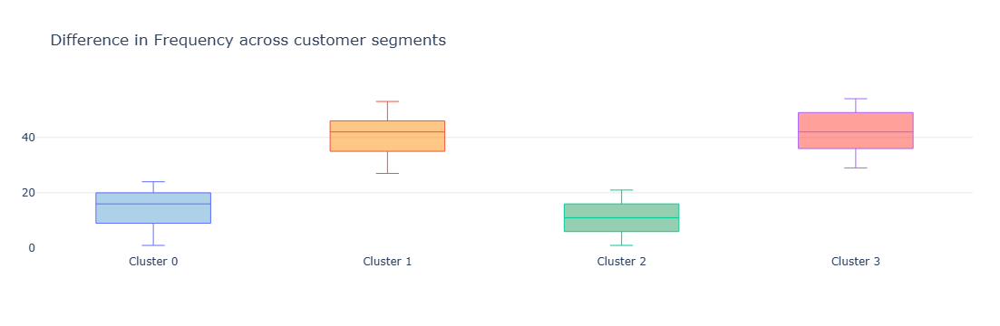

In [161]:
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode()

x_data = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3']
cutoff_quantile = 80
field_to_plot = 'Frequency'

y0 = fm_segment[fm_segment['Cluster']==0][field_to_plot].values
y0 = y0[y0<np.percentile(y0, cutoff_quantile)]
y1 = fm_segment[fm_segment['Cluster']==1][field_to_plot].values
y1 = y1[y1<np.percentile(y1, cutoff_quantile)]
y2 = fm_segment[fm_segment['Cluster']==2][field_to_plot].values
y2 = y2[y2<np.percentile(y2, cutoff_quantile)]
y3 = fm_segment[fm_segment['Cluster']==3][field_to_plot].values
y3 = y3[y3<np.percentile(y3, cutoff_quantile)]

y_data = [y0,y1,y2,y3]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)']
traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints=False,
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(size=2),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in {} across customer segments'.format(field_to_plot),
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(l=40, r=30, b=80, t=100),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)

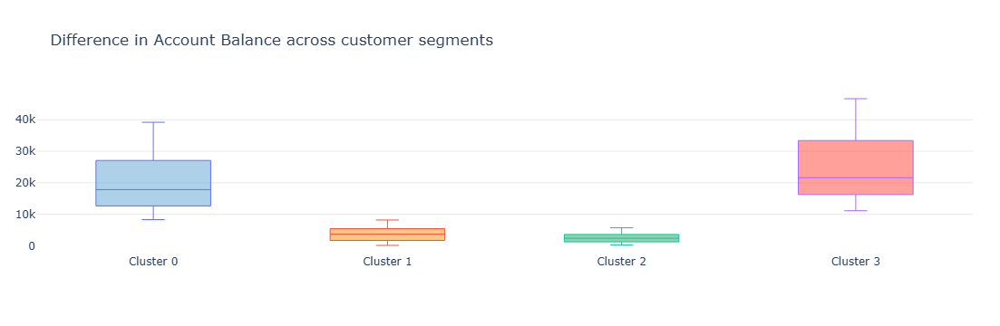

In [162]:
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode()

x_data = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3']
cutoff_quantile = 80
field_to_plot = 'Monetary'

y0 = fm_segment[fm_segment['Cluster']==0][field_to_plot].values
y0 = y0[y0<np.percentile(y0, cutoff_quantile)]
y1 = fm_segment[fm_segment['Cluster']==1][field_to_plot].values
y1 = y1[y1<np.percentile(y1, cutoff_quantile)]
y2 = fm_segment[fm_segment['Cluster']==2][field_to_plot].values
y2 = y2[y2<np.percentile(y2, cutoff_quantile)]
y3 = fm_segment[fm_segment['Cluster']==3][field_to_plot].values
y3 = y3[y3<np.percentile(y3, cutoff_quantile)]

y_data = [y0,y1,y2,y3]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)']
traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints=False,
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(size=2),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in Account Balance across customer segments',
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(l=40, r=30, b=80, t=100),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)

In [163]:
fm_segment.head()

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2


In [164]:
seg = fm_segment.copy()

In [165]:
seg.reset_index(inplace=True)

In [166]:
seg.head()

,CIFs,Frequency,Monetary,frequency_log,amount_log,Cluster
0,1001,30,13872.0,3.401197,9.537628,0
1,1002,50,3408.0,3.912023,8.133881,1
2,1003,9,21480.0,2.197225,9.974878,0
3,1004,35,62860.0,3.555348,11.048665,3
4,1005,8,5713.0,2.079442,8.650500,2


In [167]:
seg = seg[['CIFs', 'Cluster']]

In [168]:
seg.head()

,CIFs,Cluster
0,1001,0
1,1002,1
2,1003,0
3,1004,3
4,1005,2


In [169]:
new_df = df_clean.merge(seg, left_on='CIFs', right_on='CIFs')

In [170]:
new_df.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0,0
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0,1
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0,0
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,Approved,Stocks,835.0,3
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,Rejected,Bonds,785.0,2


In [171]:
amount = new_df.copy()

In [172]:
amount.set_index('CIFs', inplace=True)

In [173]:
amount.head()

,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
CIFs,,,,,,,,,,,,,
1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0,0
1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0,1
1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0,0
1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,Approved,Stocks,835.0,3
1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,Rejected,Bonds,785.0,2


In [174]:
amount = amount[['Cluster', 'Account_Balance']]
amount.head()

,Cluster,Account_Balance
CIFs,,
1001,0,13872
1002,1,3408
1003,0,21480
1004,3,62860
1005,2,5713


In [175]:
a0 = amount[amount['Cluster']==0]
a1 = amount[amount['Cluster']==1]
a2 = amount[amount['Cluster']==2]
a3 = amount[amount['Cluster']==3]

In [176]:
a0.describe()

,Cluster,Account_Balance
count,186.0,186.000000
mean,0.0,27394.623656
std,0.0,17273.751586
min,0.0,8316.000000
25%,0.0,14088.750000
50%,0.0,22520.000000
75%,0.0,37127.750000
max,0.0,86832.000000


In [177]:
a1.describe()

,Cluster,Account_Balance
count,248.0,248.000000
mean,1.0,4940.983871
std,0.0,3110.604344
min,1.0,137.000000
25%,1.0,2335.500000
50%,1.0,4562.500000
75%,1.0,7541.500000
max,1.0,11074.000000


In [178]:
a2.describe()

,Cluster,Account_Balance
count,190.0,190.000000
mean,2.0,3513.863158
std,0.0,2432.621390
min,2.0,308.000000
25%,2.0,1425.250000
50%,2.0,2867.000000
75%,2.0,5103.000000
max,2.0,9713.000000


In [179]:
a3.describe()

,Cluster,Account_Balance
count,176.0,176.000000
mean,3.0,32461.125000
std,0.0,18856.123842
min,3.0,11133.000000
25%,3.0,17370.000000
50%,3.0,27269.000000
75%,3.0,41343.000000
max,3.0,89254.000000


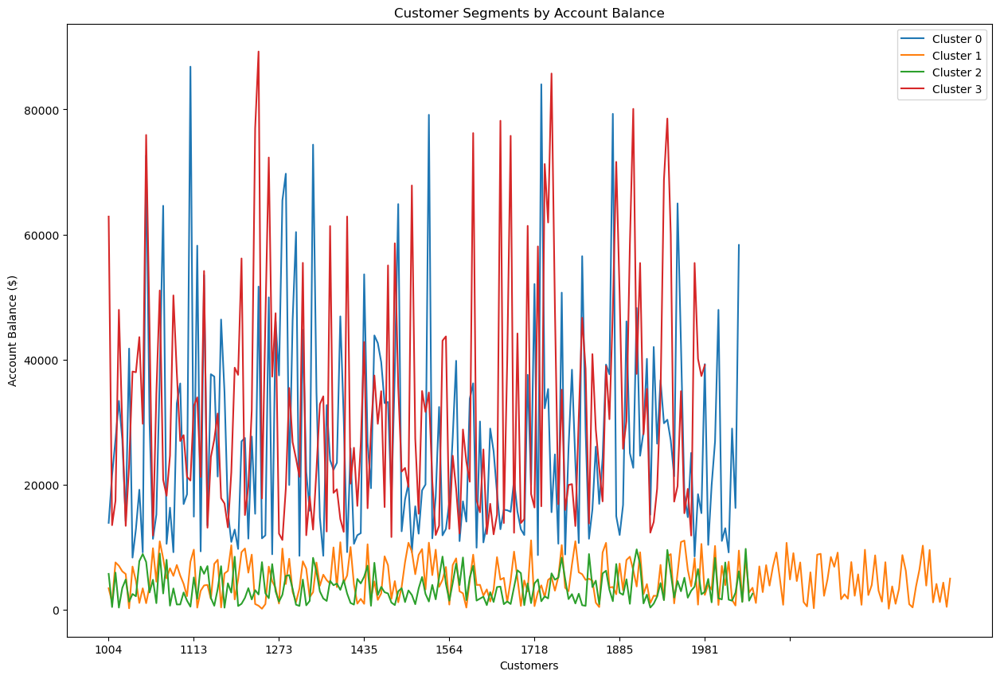

In [180]:
plt.figure(figsize=(15,10))
plt.title('Customer Segments by Account Balance')
a0['Account_Balance'].plot()
a1['Account_Balance'].plot()
a2['Account_Balance'].plot()
a3['Account_Balance'].plot()
plt.legend(['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3'])
plt.ylabel('Account Balance ($)')
plt.xlabel('Customers')
plt.show()

In [181]:
print("Columns in amount DataFrame:")
print(amount.columns.tolist())

print("\nSample of amount data:")
print(amount.head())

Columns in amount DataFrame:
['Cluster', 'Account_Balance']

Sample of amount data:
      Cluster  Account_Balance
CIFs                          
1001        0            13872
1002        1             3408
1003        0            21480
1004        3            62860
1005        2             5713


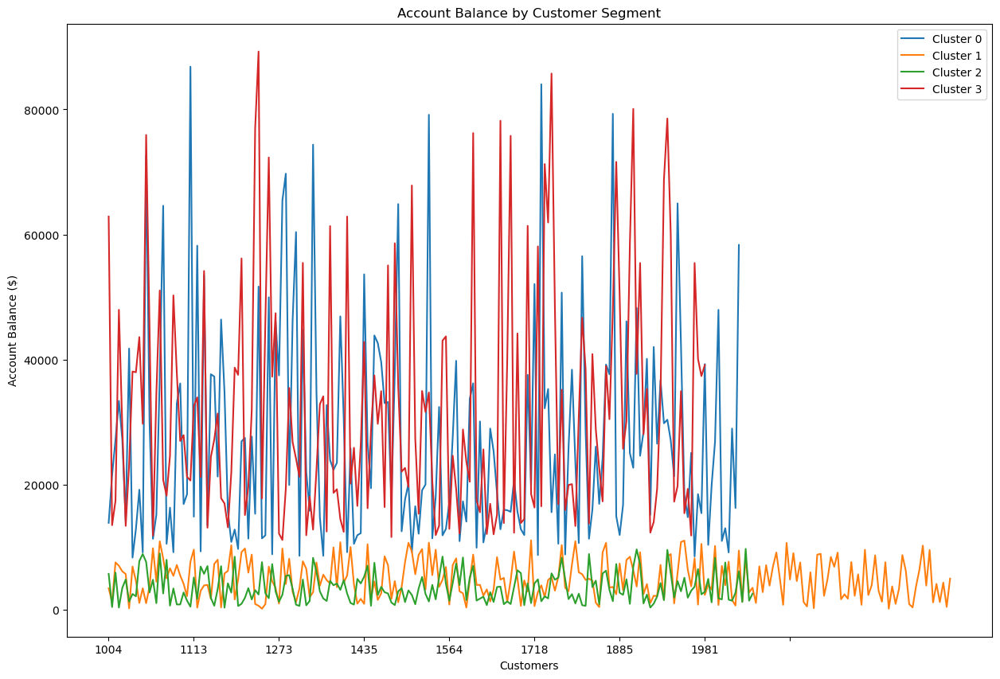

In [182]:
plt.figure(figsize=(15,10))
plt.title('Account Balance by Customer Segment')
a0['Account_Balance'].plot()
a1['Account_Balance'].plot()
a2['Account_Balance'].plot()
a3['Account_Balance'].plot()
plt.legend(['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3'])
plt.ylabel('Account Balance ($)')
plt.xlabel('Customers')
plt.show()

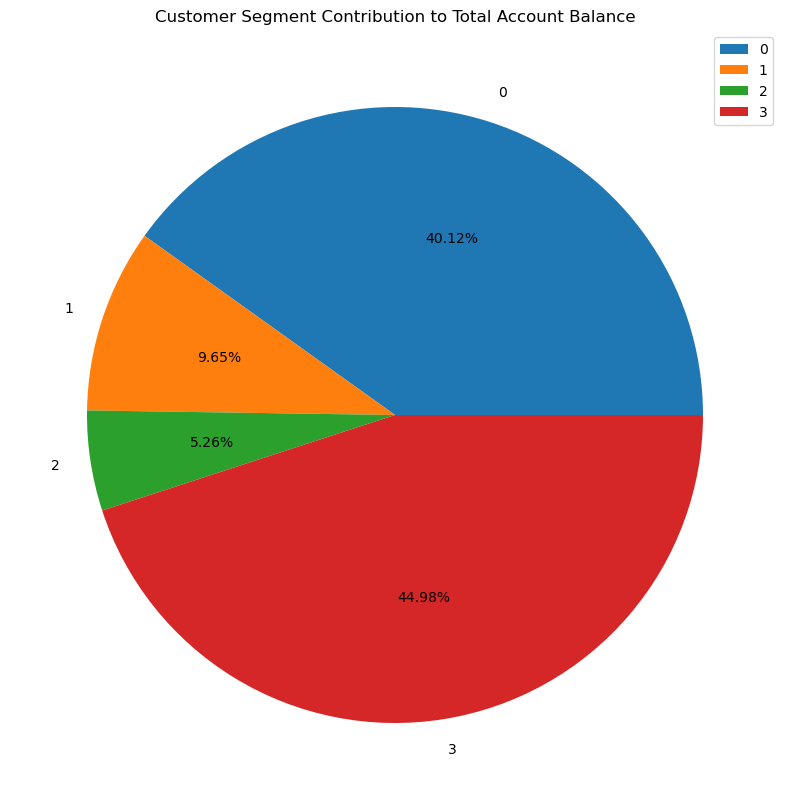

In [183]:
plt.figure(figsize=(10,10))
amount.groupby('Cluster')['Account_Balance'].sum().plot(kind='pie', autopct='%1.2f%%')
plt.title('Customer Segment Contribution to Total Account Balance')
plt.ylabel('')  # Remove the 'Account_Balance' label
plt.legend()
plt.show()

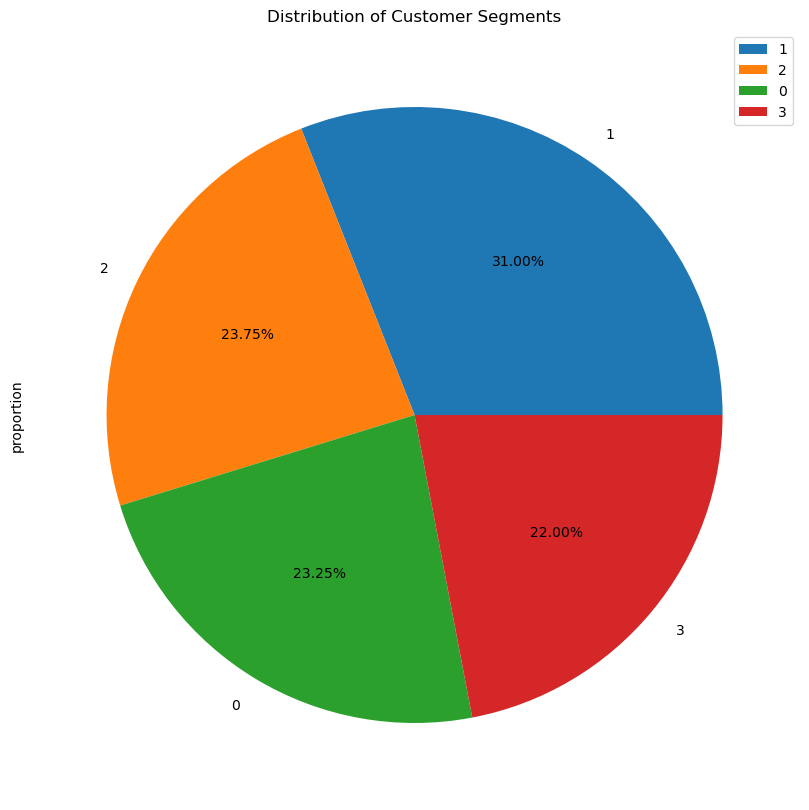

In [184]:
fm_segment['Cluster'].value_counts(normalize=True).plot(kind='pie', figsize=(10,10), autopct='%1.2f%%')
plt.title('Distribution of Customer Segments')
plt.legend()
plt.show()

In [185]:
fm_segment['Cluster'].value_counts()

Cluster
1    248
2    190
0    186
3    176
Name: count, dtype: int64

In [186]:
fm_segment.head()

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2


In [187]:
FM.head()

,Frequency,Monetary,frequency_log,amount_log,Cluster
CIFs,,,,,
1001,30,13872.0,3.401197,9.537628,0
1002,50,3408.0,3.912023,8.133881,1
1003,9,21480.0,2.197225,9.974878,0
1004,35,62860.0,3.555348,11.048665,3
1005,8,5713.0,2.079442,8.650500,2


In [188]:
fm_data_transformed.head()

,Frequency,Monetary
0,0.002931,0.360133
1,1.081662,-0.726118
2,-1.337584,0.739535
3,0.284585,1.764662
4,-1.412628,-0.348452


# **Product By Cluster Analysis**

In [189]:
new_df.head(2)

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0,0
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0,1


In [190]:
Cluster0 = new_df[new_df['Cluster']==0]
Cluster1 = new_df[new_df['Cluster']==1]
Cluster2 = new_df[new_df['Cluster']==2]
Cluster3 = new_df[new_df['Cluster']==3]

## Cluster 0

In [191]:
Cluster0.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0,0
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0,0
28,1036,67,Male,Salaried,3392,27136,4,Savings,Gweru,ZiG,Pending,Real Estate,695.0,0
30,1039,57,Female,Business Owner,5563,33378,22,Investments,Kwekwe,USD,Approved,Mutual Funds,792.0,0
31,1040,27,Female,Business Owner,3024,27216,11,Savings,Bulawayo,USD,Pending,Bonds,567.0,0


In [192]:
by_product = Cluster0.groupby("Preferred_Product")[["Account_Balance"]].sum()

In [193]:
by_product = Cluster0.groupby("Preferred_Product")[["Account_Balance"]].sum()

In [194]:
print(by_product)

                   Account_Balance
Preferred_Product                 
Investments                1822317
Loans                      1465487
Savings                    1807596


In [195]:
products_not_bringing_revenue = by_product[by_product["Account_Balance"] <= 0]

In [196]:
products_not_bringing_revenue

,Account_Balance
Preferred_Product,


## Cluster 1

In [197]:
Cluster1.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0,1
7,1009,43,Female,Student,123,1230,50,Investments,Harare,ZiG,Pending,Real Estate,558.0,1
9,1012,44,Male,Salaried,3773,7546,43,Investments,Kwekwe,ZiG,Approved,Stocks,609.0,1
10,1013,56,Male,Civil Servant,1167,7002,27,Loans,Gweru,USD,Approved,Mutual Funds,778.0,1
12,1016,23,Female,Retired,874,6118,57,Savings,Harare,USD,Pending,Stocks,595.0,1


In [198]:
by_product = Cluster0.groupby("Preferred_Product")[["Account_Balance"]].sum()

In [199]:
print(by_product)

                   Account_Balance
Preferred_Product                 
Investments                1822317
Loans                      1465487
Savings                    1807596


In [200]:
products_not_bringing_revenue = by_product[by_product["Account_Balance"] <= 0]

In [201]:
products_not_bringing_revenue

,Account_Balance
Preferred_Product,


In [202]:
new_df.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0,0
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0,1
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0,0
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,Approved,Stocks,835.0,3
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,Rejected,Bonds,785.0,2


In [203]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CIFs                   800 non-null    object 
 1   Age                    800 non-null    int64  
 2   Gender                 800 non-null    object 
 3   Occupation             800 non-null    object 
 4   Monthly_Income         800 non-null    int64  
 5   Account_Balance        800 non-null    int64  
 6   Transaction_Frequency  800 non-null    int64  
 7   Preferred_Product      800 non-null    object 
 8   Branch_Location        800 non-null    object 
 9   Currency_Used          800 non-null    object 
 10  Loan_Status            800 non-null    object 
 11  Investment_Products    800 non-null    object 
 12  Credit_Score           761 non-null    float64
 13  Cluster                800 non-null    int64  
dtypes: float64(1), int64(5), object(8)
memory usage: 87.6+ KB


In [204]:
ranking_df = fm_segment.groupby(["Cluster"], as_index=False)["Monetary"].mean()

In [205]:
ranking_df

,Cluster,Monetary
0,0,27394.623656
1,1,4940.983871
2,2,3513.863158
3,3,32461.125000


In [206]:
ranking_df['Rank'] = [int(i) for i in ranking_df["Monetary"].rank(ascending=False)]

In [207]:
ranking_df

,Cluster,Monetary,Rank
0,0,27394.623656,2
1,1,4940.983871,3
2,2,3513.863158,4
3,3,32461.125000,1


In [208]:
ranking_df["Segment"] = list(np.where(ranking_df['Rank']==1,"platinum",np.where(ranking_df['Rank']==2,"gold",np.where(ranking_df['Rank']==3,"silver","bronze"))))

In [209]:
ranking_df

,Cluster,Monetary,Rank,Segment
0,0,27394.623656,2,gold
1,1,4940.983871,3,silver
2,2,3513.863158,4,bronze
3,3,32461.125000,1,platinum


In [210]:
z = zip(ranking_df['Cluster'].to_list(), ranking_df['Segment'].to_list())

In [211]:
dicty = dict(z)

In [212]:
dicty

{0: np.str_('gold'),
 1: np.str_('silver'),
 2: np.str_('bronze'),
 3: np.str_('platinum')}

In [213]:
new_df.replace({"Cluster": dicty}, inplace=True)

In [214]:
new_df.head()

,CIFs,Age,Gender,Occupation,Monthly_Income,Account_Balance,Transaction_Frequency,Preferred_Product,Branch_Location,Currency_Used,Loan_Status,Investment_Products,Credit_Score,Cluster
0,1001,59,Female,Business Owner,1734,13872,30,Savings,Masvingo,USD,Rejected,Real Estate,351.0,gold
1,1002,49,Female,Retired,426,3408,50,Loans,Kwekwe,USD,Approved,Mutual Funds,624.0,silver
2,1003,35,Female,Salaried,2148,21480,9,Investments,Kwekwe,USD,Pending,Stocks,576.0,gold
3,1004,63,Female,Business Owner,8980,62860,35,Investments,Kwekwe,USD,Approved,Stocks,835.0,platinum
4,1005,28,Female,Business Owner,5713,5713,8,Savings,Gweru,USD,Rejected,Bonds,785.0,bronze


In [215]:
new_df.to_csv("Indvidual Customer Segmentation.csv")

In [217]:
# === DEBUG: Check your actual DataFrame structure ===
print("📊 Your DataFrame Info:")
print(f"DataFrame shape: {df.shape}")
print(f"Column names: {list(df.columns)}")
print(f"First few rows:")
print(df.head(3))

# Check if you have cluster labels (common column names)
cluster_columns = [col for col in df.columns if 'cluster' in col.lower() or 'segment' in col.lower()]
print(f"Cluster-related columns: {cluster_columns}")

# Check for client ID columns
id_columns = [col for col in df.columns if 'id' in col.lower() or 'client' in col.lower()]
print(f"ID-related columns: {id_columns}")

# Check balance/amount columns
balance_columns = [col for col in df.columns if 'balance' in col.lower() or 'amount' in col.lower() or 'value' in col.lower()]
print(f"Balance-related columns: {balance_columns}")

📊 Your DataFrame Info:
DataFrame shape: (1000, 13)
Column names: ['CIFs', 'Age', 'Gender', 'Occupation', 'Monthly_Income', 'Account_Balance', 'Transaction_Frequency', 'Preferred_Product', 'Branch_Location', 'Currency_Used', 'Loan_Status', 'Investment_Products', 'Credit_Score']
First few rows:
   CIFs  Age  Gender      Occupation  Monthly_Income  Account_Balance  \
0  1001   59  Female  Business Owner            1734            13872   
1  1002   49  Female         Retired             426             3408   
2  1003   35  Female        Salaried            2148            21480   

   Transaction_Frequency Preferred_Product Branch_Location Currency_Used  \
0                     30           Savings        Masvingo           USD   
1                     50             Loans          Kwekwe           USD   
2                      9       Investments          Kwekwe           USD   

  Loan_Status Investment_Products  Credit_Score  
0    Rejected         Real Estate         351.0  
1    App

In [221]:
# === EXPORT CODE WITH JSON FIX ===
import os
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json

# Custom JSON encoder to handle numpy types
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, (np.integer, np.int64, np.int32)):
            return int(obj)
        elif isinstance(obj, (np.floating, np.float64, np.float32)):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NumpyEncoder, self).default(obj)

def export_for_webapp():
    print("🔄 Exporting results for web application...")
    
    # Create directories if they don't exist
    directories = [
        '../backend/data',
        '../backend/data/charts', 
        '../backend/models'
    ]
    
    for directory in directories:
        os.makedirs(directory, exist_ok=True)
        print(f"✅ Created directory: {directory}")
    
    # Use your actual column names
    web_df = df.copy()
    
    # 1. Rename columns to match web app expectations
    web_df = web_df.rename(columns={
        'CIFs': 'client_id',
        'Account_Balance': 'balance',
        'Credit_Score': 'risk_score'
    })
    
    # 2. Create cluster labels using KMeans on your numeric data
    print("🔍 Performing client segmentation with KMeans...")
    
    # Select numeric features for clustering
    numeric_features = ['Age', 'Monthly_Income', 'balance', 'Transaction_Frequency', 'risk_score']
    
    # Prepare data for clustering
    X = web_df[numeric_features].fillna(0)
    
    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Apply KMeans clustering (4 segments as in your project)
    kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(X_scaled)
    
    # Map clusters to meaningful segment names based on characteristics
    cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
    
    segment_names = {}
    for i, center in enumerate(cluster_centers):
        balance_idx = numeric_features.index('balance')
        income_idx = numeric_features.index('Monthly_Income')
        
        avg_balance = center[balance_idx]
        avg_income = center[income_idx]
        
        if avg_balance > 20000 and avg_income > 2000:
            segment_names[i] = 'High Net Worth'
        elif avg_balance > 10000 and avg_income > 1500:
            segment_names[i] = 'Premium Clients'
        elif avg_balance > 5000:
            segment_names[i] = 'Emerging Affluent'
        else:
            segment_names[i] = 'Mass Market'
    
    web_df['cluster_label'] = [segment_names.get(cluster, f'Segment_{cluster}') for cluster in clusters]
    
    # 3. Add missing columns needed for web app
    web_df['products_owned'] = web_df['Investment_Products'].apply(lambda x: len(str(x).split(',')) if pd.notna(x) else 1)
    
    # Create predicted_value based on balance and income
    web_df['predicted_value'] = (web_df['balance'] * 1.2 + web_df['Monthly_Income'] * 12).round(2)
    
    # 4. Select final columns for web app
    final_columns = ['client_id', 'balance', 'products_owned', 'risk_score', 'cluster_label', 'predicted_value']
    web_df_final = web_df[final_columns]
    
    # Save processed data
    web_df_final.to_csv('../backend/data/processed_clients.csv', index=False)
    print(f"✅ Processed data saved: {len(web_df_final)} clients")
    
    # 5. Save model artifacts
    joblib.dump(kmeans, '../backend/models/kmeans_model.joblib')
    joblib.dump(scaler, '../backend/models/scaler.joblib')
    print("✅ Models saved")
    
    # 6. Create and save visualizations
    print("📊 Creating visualizations...")
    
    # Segment distribution
    plt.figure(figsize=(10, 6))
    segment_counts = web_df_final['cluster_label'].value_counts()
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
    
    bars = plt.bar(segment_counts.index, segment_counts.values, color=colors[:len(segment_counts)])
    plt.title('Client Segment Distribution', fontsize=14, fontweight='bold')
    plt.xlabel('Client Segments')
    plt.ylabel('Number of Clients')
    plt.xticks(rotation=45)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.savefig('../backend/data/charts/segment_distribution.png', dpi=300, bbox_inches='tight')
    plt.close()
    
    # Balance analysis by segment
    plt.figure(figsize=(12, 6))
    web_df_final.boxplot(column='balance', by='cluster_label', grid=False)
    plt.title('Balance Distribution by Client Segment', fontweight='bold')
    plt.suptitle('')
    plt.xlabel('Client Segment')
    plt.ylabel('Balance ($)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('../backend/data/charts/balance_analysis.png', dpi=300, bbox_inches='tight')
    plt.close()
    
    print("✅ Static charts saved")
    
    # 7. Create interactive Plotly charts
    print("📈 Creating interactive charts...")
    
    # Scatter plot: Balance vs Predicted Value
    fig = px.scatter(web_df_final, x='balance', y='predicted_value',
                     color='cluster_label',
                     title='<b>Client Segments: Balance vs Predicted Value</b>',
                     hover_data=['client_id', 'products_owned', 'risk_score'],
                     labels={'balance': 'Account Balance ($)',
                            'predicted_value': 'Predicted Value ($)',
                            'cluster_label': 'Client Segment'})
    fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')
    fig.write_html('../backend/data/charts/interactive_scatter.html')
    
    # Segment distribution pie chart
    fig = px.pie(segment_counts, 
                 values=segment_counts.values,
                 names=segment_counts.index,
                 title='<b>Client Segment Distribution</b>',
                 color_discrete_sequence=px.colors.qualitative.Set3)
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.write_html('../backend/data/charts/segment_pie.html')
    
    # Average balance by segment
    avg_balance = web_df_final.groupby('cluster_label')['balance'].mean().reset_index()
    fig = px.bar(avg_balance, x='cluster_label', y='balance',
                 title='<b>Average Balance by Client Segment</b>',
                 labels={'cluster_label': 'Client Segment', 'balance': 'Average Balance ($)'},
                 color='cluster_label')
    fig.update_layout(xaxis_tickangle=-45)
    fig.write_html('../backend/data/charts/balance_bar.html')
    
    print("✅ Interactive charts saved")
    
    # 8. Create summary statistics with proper JSON serialization
    summary = {
        'total_clients': int(len(web_df_final)),  # Convert to native Python int
        'total_assets': float(web_df_final['balance'].sum()),  # Convert to native Python float
        'avg_balance': float(web_df_final['balance'].mean()),
        'segments_count': int(web_df_final['cluster_label'].nunique()),
        'segment_breakdown': {k: int(v) for k, v in segment_counts.to_dict().items()},  # Convert all to native types
        'export_timestamp': pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')
    }
    
    # Save summary as JSON with custom encoder
    with open('../backend/data/summary_stats.json', 'w') as f:
        json.dump(summary, f, indent=2, cls=NumpyEncoder)
    
    print("✅ Summary statistics exported")
    
    # Print cluster analysis
    print("\n🔬 CLUSTER ANALYSIS RESULTS:")
    for i, (segment, count) in enumerate(segment_counts.items()):
        cluster_data = web_df_final[web_df_final['cluster_label'] == segment]
        print(f"   {segment}:")
        print(f"     • Clients: {count}")
        print(f"     • Avg Balance: ${cluster_data['balance'].mean():,.2f}")
        print(f"     • Avg Risk Score: {cluster_data['risk_score'].mean():.1f}")
        print(f"     • Avg Products: {cluster_data['products_owned'].mean():.1f}")
    
    print(f"""
🎉 EXPORT COMPLETED SUCCESSFULLY!

📊 YOUR DATA SUMMARY:
   • Total Clients: {summary['total_clients']:,}
   • Total Assets: ${summary['total_assets']:,.2f}
   • Average Balance: ${summary['avg_balance']:,.2f}
   • Segments Created: {summary['segments_count']}

📁 FILES CREATED:
   • ../backend/data/processed_clients.csv
   • ../backend/models/kmeans_model.joblib
   • ../backend/models/scaler.joblib
   • ../backend/data/charts/segment_distribution.png
   • ../backend/data/charts/balance_analysis.png
   • ../backend/data/charts/interactive_scatter.html
   • ../backend/data/charts/segment_pie.html
   • ../backend/data/charts/balance_bar.html
   • ../backend/data/summary_stats.json

Your ClientSphere web app is now ready with REAL client segmentation!
""")

# Run the export
export_for_webapp()

🔄 Exporting results for web application...
✅ Created directory: ../backend/data
✅ Created directory: ../backend/data/charts
✅ Created directory: ../backend/models
🔍 Performing client segmentation with KMeans...
✅ Processed data saved: 1000 clients
✅ Models saved
📊 Creating visualizations...
✅ Static charts saved
📈 Creating interactive charts...
✅ Interactive charts saved
✅ Summary statistics exported

🔬 CLUSTER ANALYSIS RESULTS:
   Emerging Affluent:
     • Clients: 794
     • Avg Balance: $8,973.29
     • Avg Risk Score: 575.1
     • Avg Products: 1.0
   High Net Worth:
     • Clients: 206
     • Avg Balance: $43,364.92
     • Avg Risk Score: 568.4
     • Avg Products: 1.0

🎉 EXPORT COMPLETED SUCCESSFULLY!

📊 YOUR DATA SUMMARY:
   • Total Clients: 1,000
   • Total Assets: $16,057,966.00
   • Average Balance: $16,057.97
   • Segments Created: 2

📁 FILES CREATED:
   • ../backend/data/processed_clients.csv
   • ../backend/models/kmeans_model.joblib
   • ../backend/models/scaler.joblib
  